# HR Analytics Project No 04

### Problem Statement 

Attrition is a problem that impacts all businesses, irrespective of geography, industry and size of the company. Employee attrition leads to significant costs for a business, including the cost of business disruption, hiring new staff and training new staff. As such, there is great business interest in understanding the drivers of, and minimizing staff attrition. Let us therefore turn to our predictive modelling capabilities and see if we can predict employee attrition on this IBM dataset.

# Importing Data

In [2]:
#Importing libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')


In [3]:
# Import dataset
df = pd.read_csv(r'C:\Users\RSarkar\Desktop\phase 1 project\HR-Employee-Attrition.csv')

df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


### Exploratory Data Analysis(EDA)

In [4]:
df.head(10) # Showing data of 10 rows

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,...,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,...,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,...,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,...,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,...,2,80,2,17,3,2,7,7,7,7


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [6]:
#There are 35 features and label, among that 9 features are categorical and rest 26 are continuous in nature

In [7]:
df.isnull().sum() #Checking Null values

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [8]:
# No Null values present in data, but we have to check individually

In [9]:
df.columns #to see the columns names

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [10]:
df.shape #Shape of dataset

(1470, 35)

In [11]:
df.dtypes  #Check the data types of the columns

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [12]:
df.describe() # Describing the dataset

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [13]:
df.drop_duplicates(inplace=True) #Checking for Duplicate Values

In [14]:
df.shape

(1470, 35)

### Checking to see the unique values in the columns

In [15]:
df['Attrition'].unique() # we see there are some examples of unique data in the target variable AveragePrice

array(['Yes', 'No'], dtype=object)

In [16]:
df['Age'].nunique() # to see the no of values in age

43

In [17]:
df['BusinessTravel'].unique() # we need to use ordinal encoder for this as more weighs for someone who travels more

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

we see the different categories , we need to use ordinal encoder for this as more weighs for someone who travels more 

In [18]:
df['DailyRate'].nunique() #we see 886 unique values here

886

In [19]:
df['Department'].unique() #There are three categories in department

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

In [20]:
df['DistanceFromHome'].nunique() # Distancefromhome has 29 unique values

29

In [21]:
df['Education'].unique() # Education has 5 lavels

array([2, 1, 4, 3, 5], dtype=int64)

In [22]:
df['EducationField'].unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

we have 6 categories in different fields we cannot differentiate the weightage so we will give label encoding here

In [23]:
df['EmployeeCount'].unique() # we can do away with this column as it has the same value for all rows as seen here

array([1], dtype=int64)

In [24]:
df['EnvironmentSatisfaction'].unique() #this is ratings based where 4 is highest and 1 is lowest

array([2, 3, 4, 1], dtype=int64)

In [25]:
df['Gender'].unique() # Gender column will encode

array(['Female', 'Male'], dtype=object)

In [26]:
df['HourlyRate'].nunique() # Single values in the column

71

In [27]:
df['JobInvolvement'].unique() #This is  based on weightage were higher the number more weight

array([3, 2, 4, 1], dtype=int64)

In [28]:
df['JobLevel'].unique() #Same as before higher the better

array([2, 1, 3, 4, 5], dtype=int64)

In [29]:
df['JobRole'].unique() 

#In 9 columns, HR and manger and director have more weightage

array(['Sales Executive', 'Research Scientist', 'Laboratory Technician',
       'Manufacturing Director', 'Healthcare Representative', 'Manager',
       'Sales Representative', 'Research Director', 'Human Resources'],
      dtype=object)

In [30]:
df['JobSatisfaction'].unique() #In JobSatisfaction column 4 is higest and lowest is 1

array([4, 2, 3, 1], dtype=int64)

In [31]:
df['MaritalStatus'].unique() # Column has 3 categories

array(['Single', 'Married', 'Divorced'], dtype=object)

In [32]:
df['MonthlyIncome'].nunique() # Single values in the column

1349

In [33]:
df['MonthlyRate'].nunique() # Single values in the column

1427

In [34]:
df['NumCompaniesWorked'].unique() #max people have worked in different companies

array([8, 1, 6, 9, 0, 4, 5, 2, 7, 3], dtype=int64)

In [35]:
df['OverTime'].unique() # we have two categories 

array(['Yes', 'No'], dtype=object)

In [36]:
df['PercentSalaryHike'].unique() # we have 15 categories

array([11, 23, 15, 12, 13, 20, 22, 21, 17, 14, 16, 18, 19, 24, 25],
      dtype=int64)

In [37]:
df['PerformanceRating'].unique() # only two ratings

array([3, 4], dtype=int64)

In [38]:
df['RelationshipSatisfaction'].unique() # 4 types of rating columns 

array([1, 4, 2, 3], dtype=int64)

In [39]:
df['TotalWorkingYears'].unique() #we see that employees worked max of 40 years and min of 0 years

array([ 8, 10,  7,  6, 12,  1, 17,  5,  3, 31, 13,  0, 26, 24, 22,  9, 19,
        2, 23, 14, 15,  4, 29, 28, 21, 25, 20, 11, 16, 37, 38, 30, 40, 18,
       36, 34, 32, 33, 35, 27], dtype=int64)

In [40]:
df['TrainingTimesLastYear'].unique() # no of trainings undergone last year

array([0, 3, 2, 5, 1, 4, 6], dtype=int64)

In [41]:
df['WorkLifeBalance'].unique() # higher the better in this column

array([1, 3, 2, 4], dtype=int64)

In [42]:
df['YearsAtCompany'].unique() # No. of year working in company

array([ 6, 10,  0,  8,  2,  7,  1,  9,  5,  4, 25,  3, 12, 14, 22, 15, 27,
       21, 17, 11, 13, 37, 16, 20, 40, 24, 33, 19, 36, 18, 29, 31, 32, 34,
       26, 30, 23], dtype=int64)

In [43]:
df['YearsInCurrentRole'].unique() # No of years working in present position

array([ 4,  7,  0,  2,  5,  9,  8,  3,  6, 13,  1, 15, 14, 16, 11, 10, 12,
       18, 17], dtype=int64)

In [44]:
df['YearsSinceLastPromotion'].unique() #the person has been in same role highest for 18 years and lowest 0

array([ 0,  1,  3,  2,  7,  4,  8,  6,  5, 15,  9, 13, 12, 10, 11, 14],
      dtype=int64)

In [45]:
df['YearsWithCurrManager'].unique() # max is 16 and lowest is 0

array([ 5,  7,  0,  2,  6,  8,  3, 11, 17,  1,  4, 12,  9, 10, 15, 13, 16,
       14], dtype=int64)

In [46]:
# Checking the unique values in each column

for col in df:
    print(df[col].nunique(),'\n')

43 

2 

3 

886 

3 

29 

5 

6 

1 

1470 

4 

2 

71 

4 

5 

9 

4 

3 

1349 

1427 

10 

1 

2 

15 

2 

4 

1 

4 

40 

7 

4 

37 

19 

16 

18 



 Observations made in individual columns cells above . Overall there is a huge variation in the type of employees , where one is sticking for more than 35 years an some not at all , need to do more analysis 
    

In [47]:
# Checking to see if any of the values in Target 1 is white spaces

df.loc[df['Attrition'] == " "]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


As we see that both the targets have no whitespaces we can move ahead

Dropping columns with only one category for all and the index column as it doesnt give us any info

In [48]:
df.drop(columns= ['EmployeeCount','StandardHours','Over18','EmployeeNumber' ],inplace =True)

In [49]:
df.shape

(1470, 31)

### Visualization of the Data

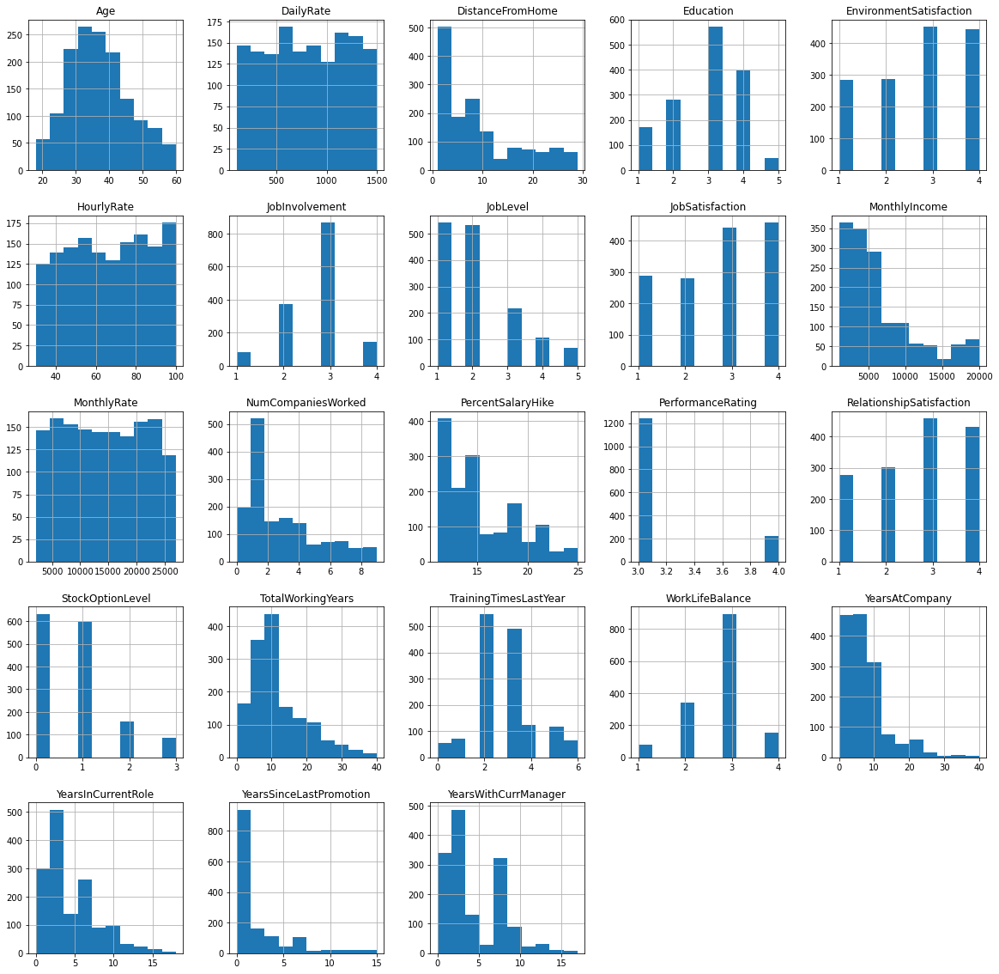

In [50]:
df.hist(figsize=(20,20))
plt.show()

We need to review each feature individually but this graph is just for showing the trend with histplot

### Divide the columns into continuous and categorical

In [51]:
# We are defining numerical & categorical columns
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 23 numerical features : ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']

We have 8 categorical features : ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']


In [52]:
df_visualization_continuous=df[['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']].copy()

In [53]:
df_visualization_nominal=df[['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']]

Visualization of the distribution of the continuous value 

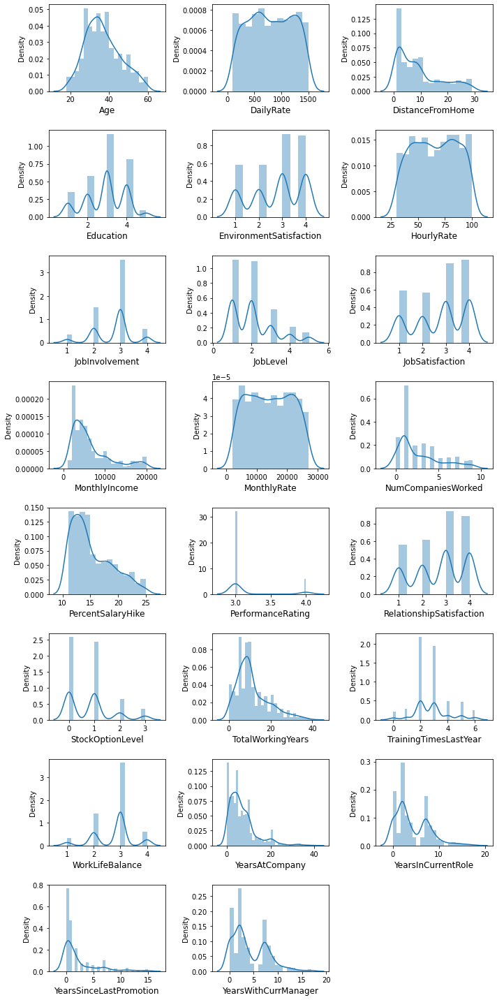

In [54]:
#Lets see how the data is distributed for every column

plt.figure(figsize =(10,20), facecolor = 'white')
plotnumber = 1

for column in df_visualization_continuous:
    if plotnumber <=24:
        ax = plt.subplot(8,3,plotnumber)
        sns.distplot(df_visualization_continuous[column])
        plt.xlabel(column,fontsize = 12)
        
    plotnumber +=1
plt.tight_layout()

In [55]:
import plotly.graph_objs as go
import plotly.offline as py
attrition = df[(df['Attrition'] != 0)]
no_attrition = df[(df['Attrition'] == 0)]

trace = go.Pie(labels = ['No_attrition', 'Yes_attrition'], values = df['Attrition'].value_counts(), 
               textfont=dict(size=15),
               marker=dict(colors=['brown','orange'], 
               line=dict(color='#000000', width=1.5)))
layout = dict(title =  'Distribution of attrition variable')          
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

There is a huge imbalance in the label and we need to treat this at the time of splitting the data into Training and testing set we see that no is 83.9% and yes is 16.1% only

### Lets graph the data for columns individually so we can make clear findings

<AxesSubplot:xlabel='Age', ylabel='Density'>

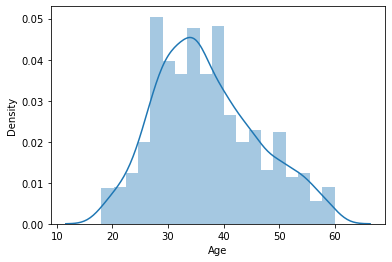

In [56]:
sns.distplot(df_visualization_continuous['Age'],kde=True)

<AxesSubplot:xlabel='Age', ylabel='Count'>

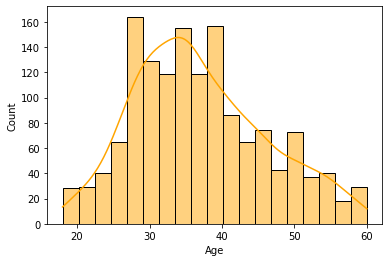

In [57]:
sns.histplot(df_visualization_continuous['Age'],kde=True,color='orange')

The data is normally distributed in the column,maximum employee categorised in 30-40 age

<AxesSubplot:xlabel='Age', ylabel='count'>

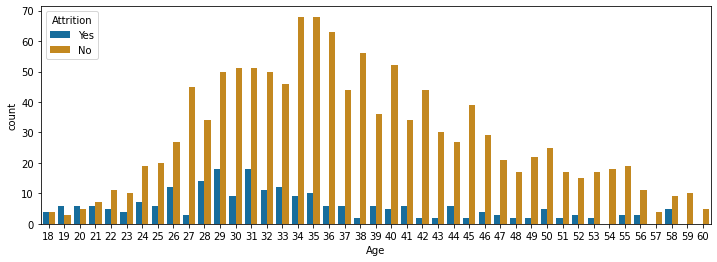

In [58]:
plt.subplots(figsize=(12,4))
sns.countplot(x="Age", hue="Attrition", data=df, palette="colorblind")

The data is normally distributed in the column,maximum employee categorised in 29-42 age

<AxesSubplot:xlabel='DailyRate', ylabel='Density'>

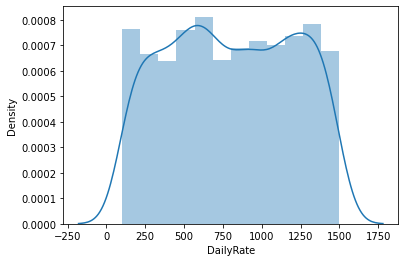

In [59]:
sns.distplot(df['DailyRate'],kde=True)

<AxesSubplot:xlabel='DailyRate', ylabel='Count'>

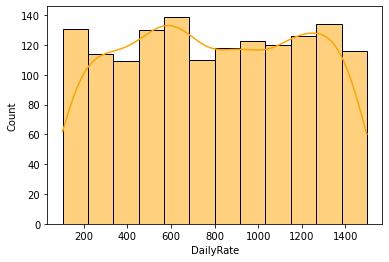

In [60]:
sns.histplot(df['DailyRate'],kde=True,color="orange")

<AxesSubplot:xlabel='DailyRate', ylabel='count'>

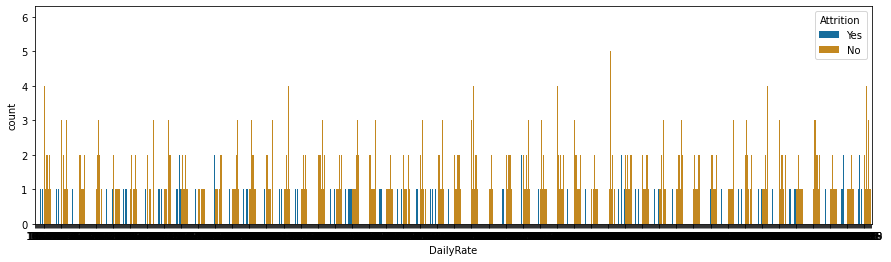

In [61]:
plt.subplots(figsize=(15,4))
sns.countplot(x="DailyRate", hue="Attrition", data=df, palette="colorblind")

#As We see that the data is very uniform and all employess are earning the rates equally as is there are equal no of employees in each range , the lowest is 100-200 approx and highest is 1400-1500 approx

<AxesSubplot:xlabel='DistanceFromHome', ylabel='Density'>

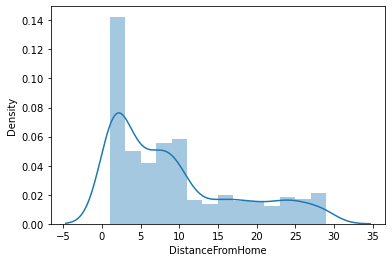

In [62]:
sns.distplot(df['DistanceFromHome'],kde=True)

<AxesSubplot:xlabel='DistanceFromHome', ylabel='Count'>

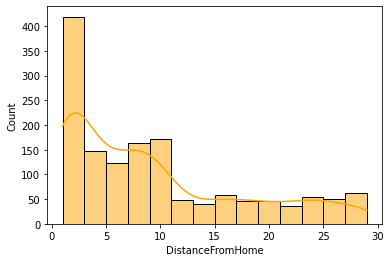

In [63]:
sns.histplot(df['DistanceFromHome'],kde=True,color = 'orange')

<AxesSubplot:xlabel='DistanceFromHome', ylabel='count'>

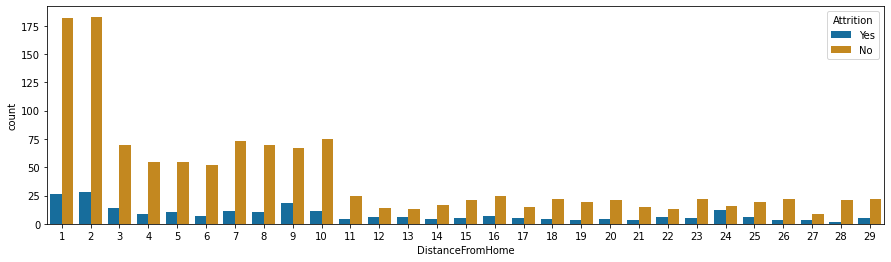

In [64]:
plt.subplots(figsize=(15,4))
sns.countplot(x="DistanceFromHome", hue="Attrition", data=df, palette="colorblind")

As we see that the data is left skewed and the max of the employees have lesser than 2 distance from work

<AxesSubplot:xlabel='Education', ylabel='Density'>

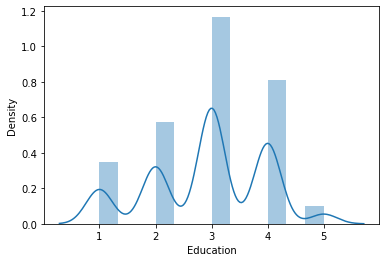

In [65]:
sns.distplot(df['Education'],kde=True )

<AxesSubplot:xlabel='Education', ylabel='Density'>

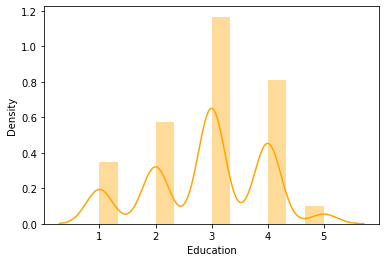

In [66]:
sns.distplot(df['Education'],kde=True,color = 'orange')

3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64


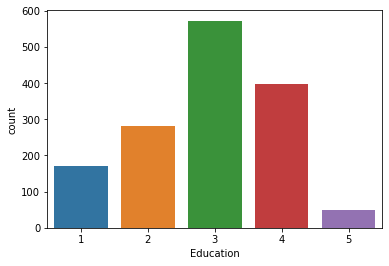

In [67]:
ax = sns.countplot(x='Education',data = df)
print(df['Education'].value_counts())

<AxesSubplot:xlabel='Education', ylabel='count'>

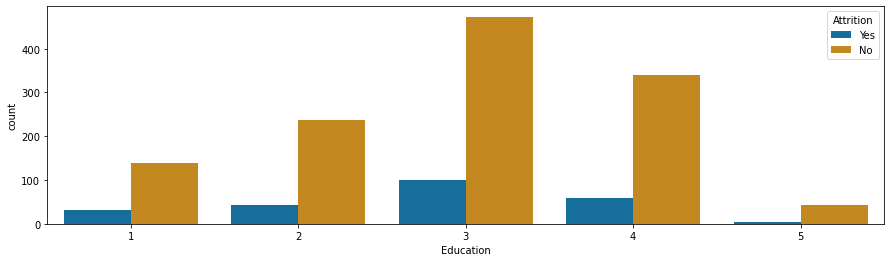

In [68]:
plt.subplots(figsize=(15,4))
sns.countplot(x="Education", hue="Attrition", data=df, palette="colorblind")

We see that the highest column has the highest attrition 

<AxesSubplot:xlabel='EnvironmentSatisfaction', ylabel='Density'>

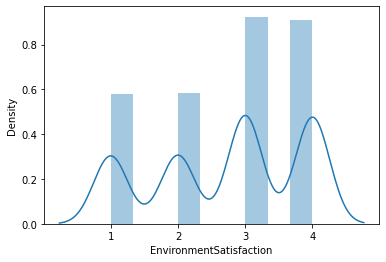

In [69]:
sns.distplot(df['EnvironmentSatisfaction'],kde=True)

<AxesSubplot:xlabel='EnvironmentSatisfaction', ylabel='Count'>

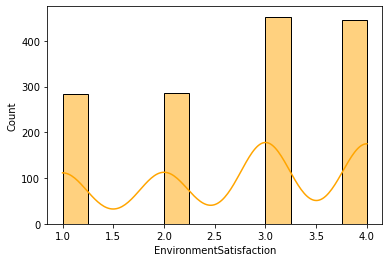

In [70]:
sns.histplot(df['EnvironmentSatisfaction'],kde=True,color ='orange')

<AxesSubplot:xlabel='EnvironmentSatisfaction', ylabel='count'>

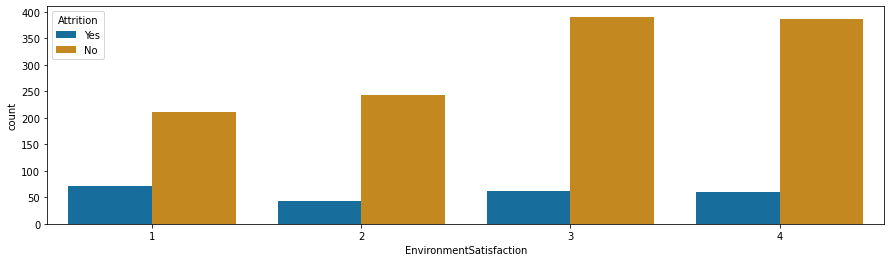

In [71]:
plt.subplots(figsize=(15,4))
sns.countplot(x="EnvironmentSatisfaction", hue="Attrition", data=df, palette="colorblind")

We see that the highest column has the highest attrition but we cant pinpoint the category where its showing high

<AxesSubplot:xlabel='HourlyRate', ylabel='Density'>

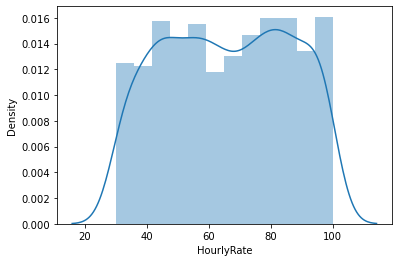

In [72]:
sns.distplot(df['HourlyRate'],kde=True)

<AxesSubplot:xlabel='HourlyRate', ylabel='Count'>

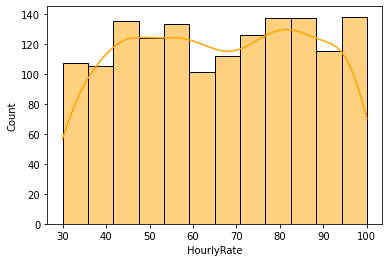

In [73]:
sns.histplot(df['HourlyRate'],kde=True,color = 'orange')

<AxesSubplot:xlabel='HourlyRate', ylabel='count'>

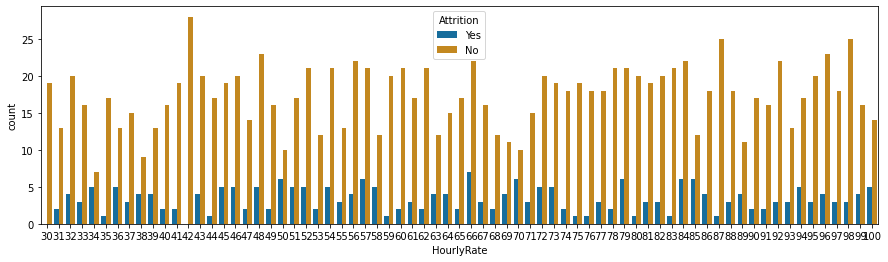

In [74]:
plt.subplots(figsize=(15,4))
sns.countplot(x="HourlyRate", hue="Attrition", data=df, palette="colorblind")

the attrition is spread uniformly among the rates employees earn , so we cant figure which range there is more , we see between 50 and 55 approx

<AxesSubplot:xlabel='JobInvolvement', ylabel='Density'>

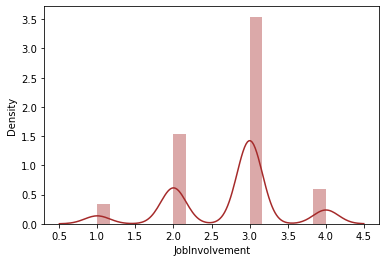

In [75]:
sns.distplot(df['JobInvolvement'],kde=True,color ='brown')

<AxesSubplot:xlabel='JobInvolvement', ylabel='Count'>

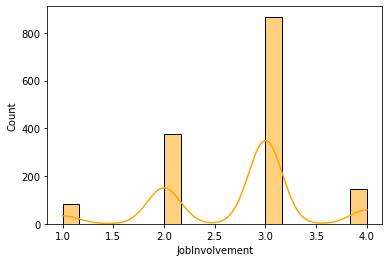

In [76]:
sns.histplot(df['JobInvolvement'],kde=True,color='orange')

<AxesSubplot:xlabel='JobInvolvement', ylabel='count'>

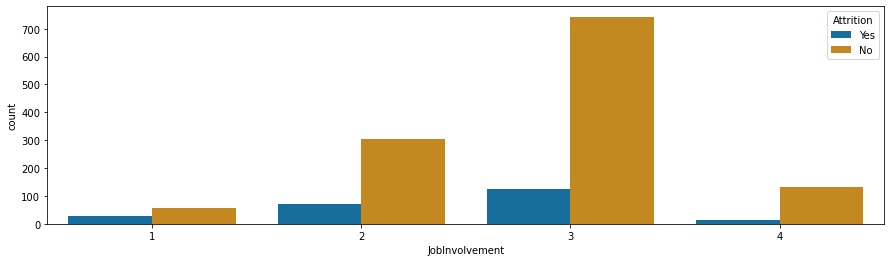

In [77]:
plt.subplots(figsize=(15,4))
sns.countplot(x="JobInvolvement", hue="Attrition", data=df, palette="colorblind")

Higher attrition in 1 as we have the least the level of ex and current is on par with each other cant decide if its playin a role as the rest is equal and 4 is the lowest so they dont leave

<AxesSubplot:xlabel='JobLevel', ylabel='Density'>

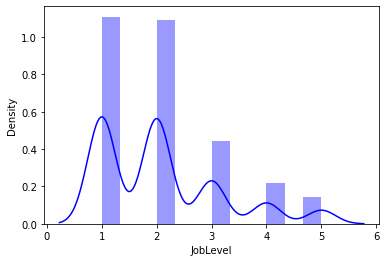

In [78]:
sns.distplot(df['JobLevel'],kde=True, color = 'blue')

<AxesSubplot:xlabel='JobLevel', ylabel='Count'>

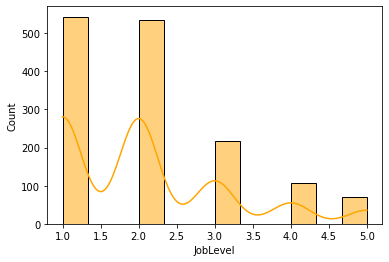

In [79]:
sns.histplot(df['JobLevel'],kde=True, color = 'orange')

<AxesSubplot:xlabel='JobLevel', ylabel='count'>

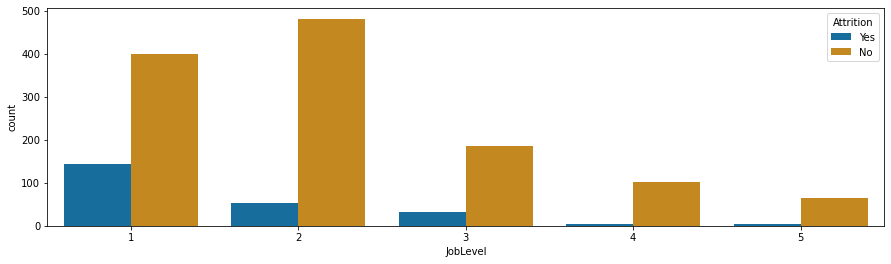

In [80]:
plt.subplots(figsize=(15,4))
sns.countplot(x="JobLevel", hue="Attrition", data=df, palette="colorblind")

 Level 1 and 2 are the highest joblevel, so people who are just starting out are leaving the company more frequently

<AxesSubplot:xlabel='JobSatisfaction', ylabel='Density'>

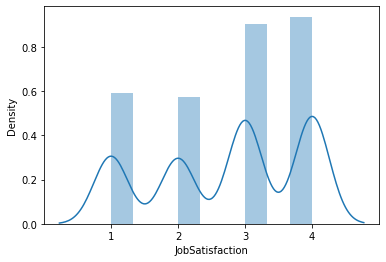

In [81]:
sns.distplot(df['JobSatisfaction'],kde=True)

<AxesSubplot:xlabel='JobSatisfaction', ylabel='Count'>

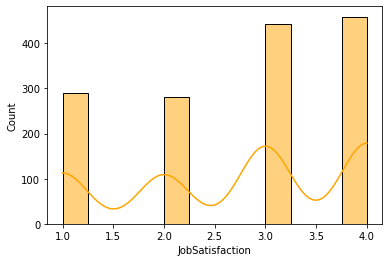

In [82]:
sns.histplot(df['JobSatisfaction'],kde=True,color='orange')

4    459
3    442
1    289
2    280
Name: JobSatisfaction, dtype: int64


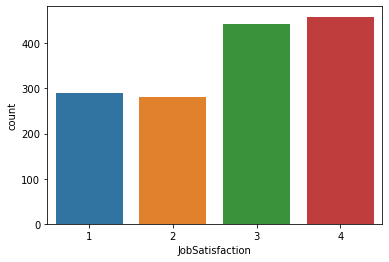

In [83]:
ax = sns.countplot(x='JobSatisfaction',data = df)
print(df['JobSatisfaction'].value_counts())

<AxesSubplot:xlabel='JobSatisfaction', ylabel='count'>

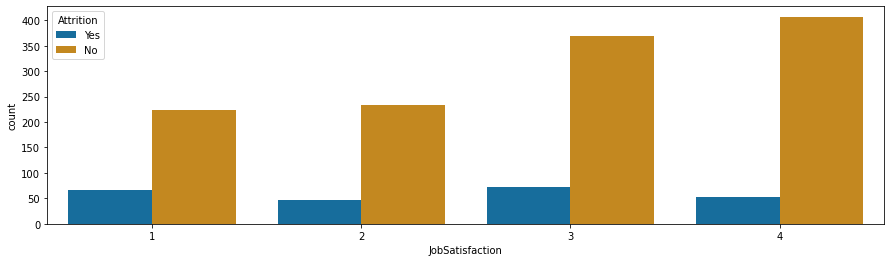

In [84]:
plt.subplots(figsize=(15,4))
sns.countplot(x="JobSatisfaction", hue="Attrition", data=df, palette="colorblind")

The employees are happy but we are seeing more people leave at 1 level and a lot of them are leaving at 3 and 4 as well , so we cant say this a factor for attrition level to be high 

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Density'>

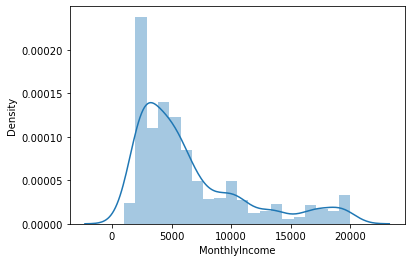

In [85]:
sns.distplot(df['MonthlyIncome'],kde=True)

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Count'>

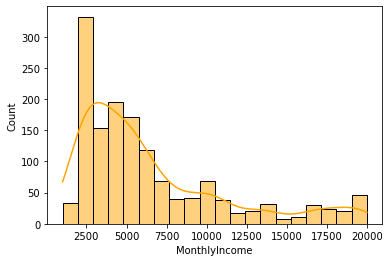

In [86]:
sns.histplot(df['MonthlyIncome'],kde=True,color='orange')

2342     4
6142     3
2741     3
2559     3
2610     3
        ..
7104     1
2773     1
19513    1
3447     1
4404     1
Name: MonthlyIncome, Length: 1349, dtype: int64


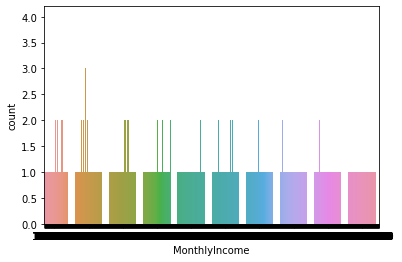

In [87]:
ax = sns.countplot(x='MonthlyIncome',data = df)
print(df['MonthlyIncome'].value_counts())

<AxesSubplot:xlabel='MonthlyIncome', ylabel='count'>

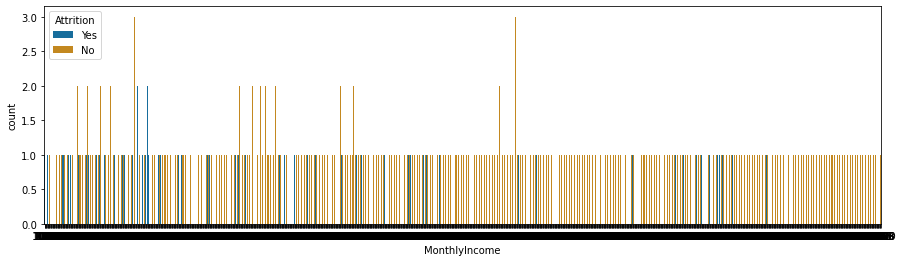

In [88]:
plt.subplots(figsize=(15,4))
sns.countplot(x="MonthlyIncome", hue="Attrition", data=df, palette="colorblind")

In [89]:
import plotly.express as px
plot_df=df.sort_values(by="Attrition")
fig=px.histogram(plot_df, x='MonthlyRate', color='Attrition', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'Yes': '#B9C0C9','No': '#CDBBA7'})
fig.update_layout(title_text='Distribution of MonthlyRate by Attrition Status',
                  xaxis_title='MonthlyRate, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

Here we see some correlation , wherein we see most people leaving are from the range 2000 -2500 and almost nill are the higher ranges , so we can say that income is a factor for employees to leave

<AxesSubplot:xlabel='MonthlyRate', ylabel='Density'>

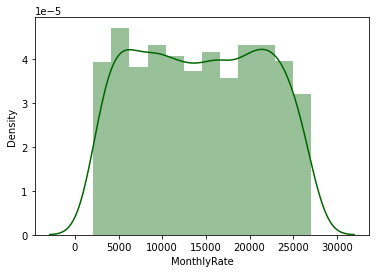

In [90]:
sns.distplot(df['MonthlyRate'],kde=True,color='darkgreen')

<AxesSubplot:xlabel='MonthlyRate', ylabel='Count'>

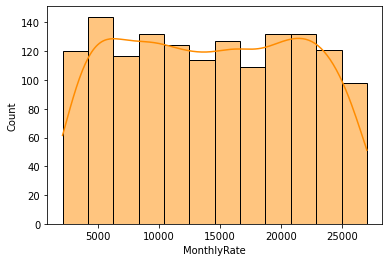

In [91]:
sns.histplot(df['MonthlyRate'],kde=True,color = 'darkorange')

<AxesSubplot:xlabel='MonthlyRate', ylabel='count'>

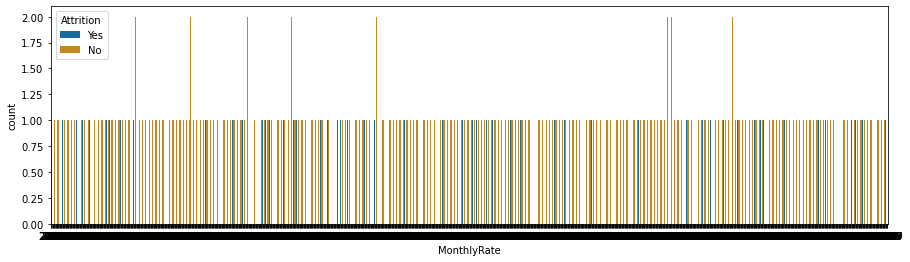

In [92]:
plt.subplots(figsize=(15,4))
sns.countplot(x="MonthlyRate", hue="Attrition", data=df, palette="colorblind")

There is some correlation, after from 18k -25k there is more attrition of job and then nil, we can say high salary will be the main factor behind. 

<AxesSubplot:xlabel='NumCompaniesWorked', ylabel='Density'>

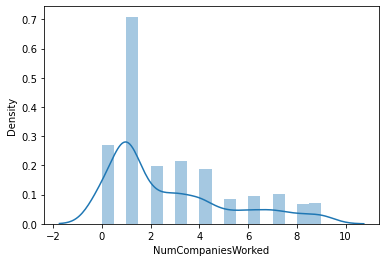

In [93]:
sns.distplot(df['NumCompaniesWorked'],kde=True)

<AxesSubplot:xlabel='NumCompaniesWorked', ylabel='Count'>

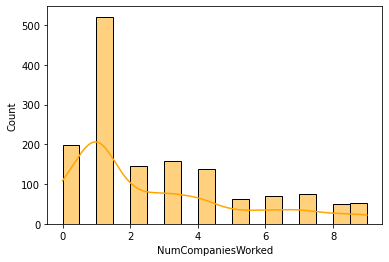

In [94]:
sns.histplot(df['NumCompaniesWorked'],kde=True,color = 'orange')

<AxesSubplot:xlabel='NumCompaniesWorked', ylabel='count'>

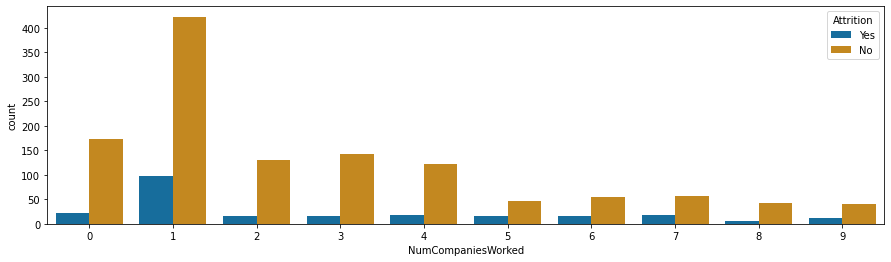

In [95]:
plt.subplots(figsize=(15,4))
sns.countplot(x="NumCompaniesWorked", hue="Attrition", data=df, palette="colorblind")

We see that more people are leaving where they worked for 1 company but the number of such employees are also the highest so we cant determine , but we see as the companies increase the attrition level decreases

<AxesSubplot:xlabel='PercentSalaryHike', ylabel='Density'>

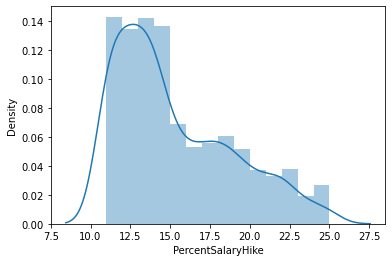

In [96]:
sns.distplot(df['PercentSalaryHike'],kde=True )

<AxesSubplot:xlabel='PercentSalaryHike', ylabel='Count'>

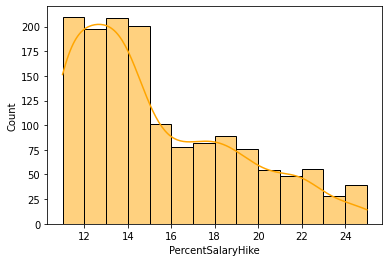

In [97]:
sns.histplot(df['PercentSalaryHike'],kde=True,color='orange')

<AxesSubplot:xlabel='PercentSalaryHike', ylabel='count'>

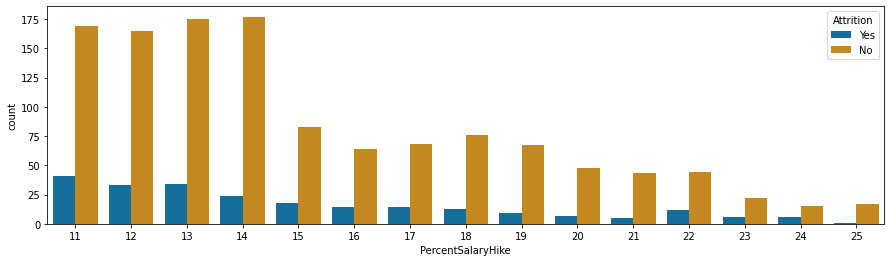

In [98]:
plt.subplots(figsize=(15,4))
sns.countplot(x="PercentSalaryHike", hue="Attrition", data=df, palette="colorblind")

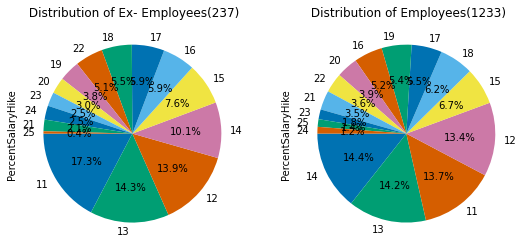

In [99]:
yes_group = df[df["Attrition"]=="Yes"]
no_group = df[df["Attrition"]=="No"]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["PercentSalaryHike"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of Ex- Employees('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["PercentSalaryHike"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of Employees('+str(len(no_group))+')');

As we see the piechart, more people are leaving in the lower range compared to the higher range and max from 11 to 14 hike , which means they leave for better salary

<AxesSubplot:xlabel='PerformanceRating', ylabel='Density'>

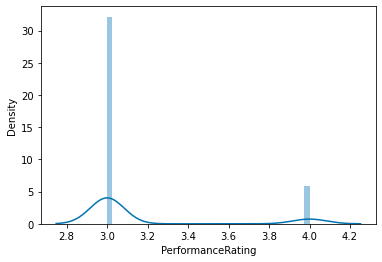

In [100]:
sns.distplot(df['PerformanceRating'],kde=True )

<AxesSubplot:xlabel='PerformanceRating', ylabel='Count'>

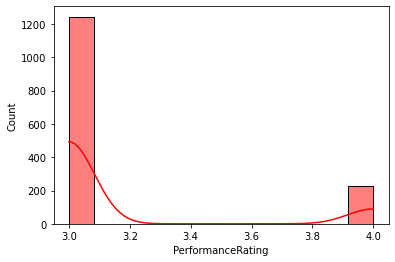

In [101]:
sns.histplot(df['PerformanceRating'],kde=True,color='red')

<AxesSubplot:xlabel='PerformanceRating', ylabel='count'>

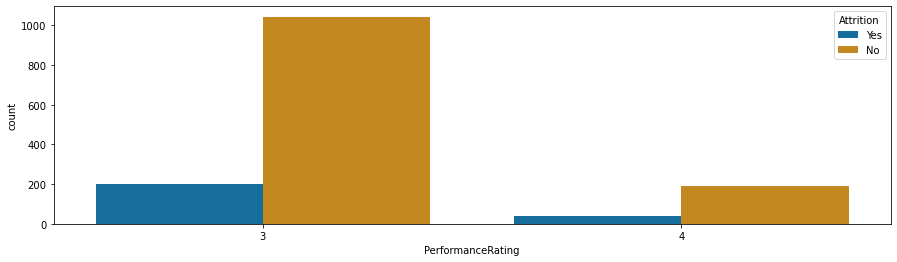

In [102]:
plt.subplots(figsize=(15,4))
sns.countplot(x="PerformanceRating", hue="Attrition", data=df, palette="colorblind")

We see that the employees are performing really well all in 3 which is a good rating and 4 which is very good ,most are in 3

<AxesSubplot:xlabel='RelationshipSatisfaction', ylabel='Density'>

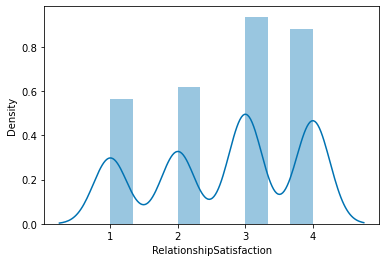

In [103]:
sns.distplot(df['RelationshipSatisfaction'],kde=True )

<AxesSubplot:xlabel='RelationshipSatisfaction', ylabel='Count'>

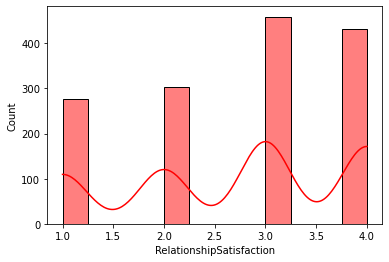

In [104]:
sns.histplot(df['RelationshipSatisfaction'],kde=True,color='red')

<AxesSubplot:xlabel='RelationshipSatisfaction', ylabel='count'>

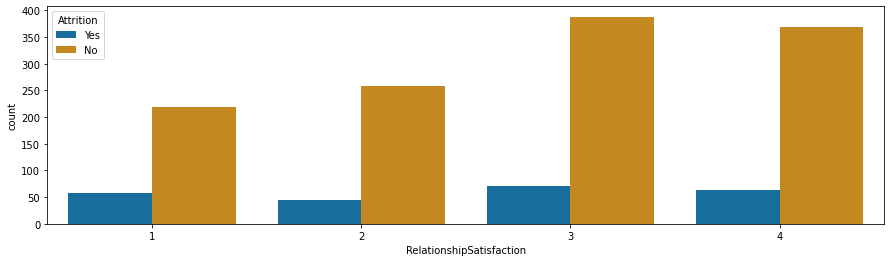

In [105]:
plt.subplots(figsize=(15,4))
sns.countplot(x="RelationshipSatisfaction", hue="Attrition", data=df, palette="colorblind")

We see that this has 4 level and higher means better , and we see all the employees majorly in 3 & 4 which is good

<AxesSubplot:xlabel='StockOptionLevel', ylabel='Density'>

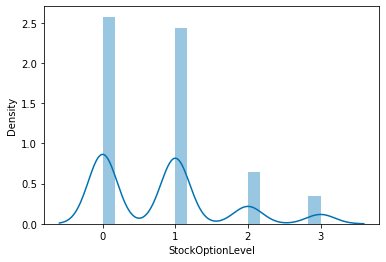

In [106]:
sns.distplot(df['StockOptionLevel'],kde=True )

<AxesSubplot:xlabel='StockOptionLevel', ylabel='Count'>

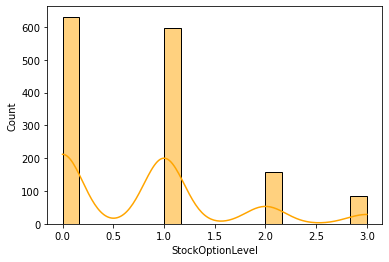

In [107]:
sns.histplot(df['StockOptionLevel'],kde=True,color='orange')

<AxesSubplot:xlabel='StockOptionLevel', ylabel='count'>

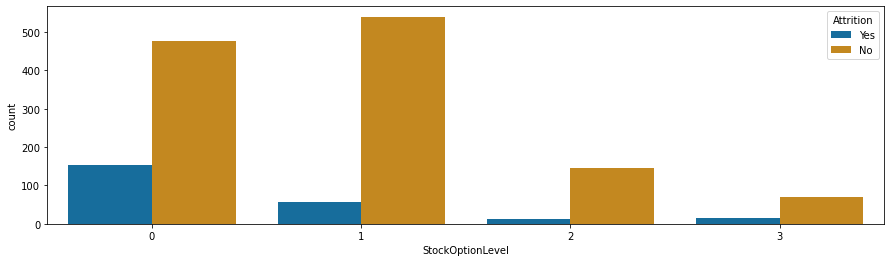

In [108]:
plt.subplots(figsize=(15,4))
sns.countplot(x="StockOptionLevel", hue="Attrition", data=df, palette="colorblind")

We see that more people are in the 0 and 1 level where they dont have stock in the company as the least is 3

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='Density'>

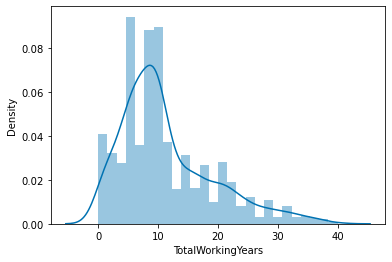

In [109]:
sns.distplot(df['TotalWorkingYears'],kde=True )

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='Count'>

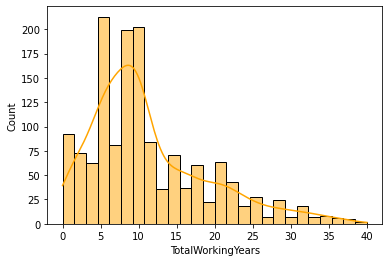

In [110]:
sns.histplot(df['TotalWorkingYears'],kde=True,color='orange')

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='count'>

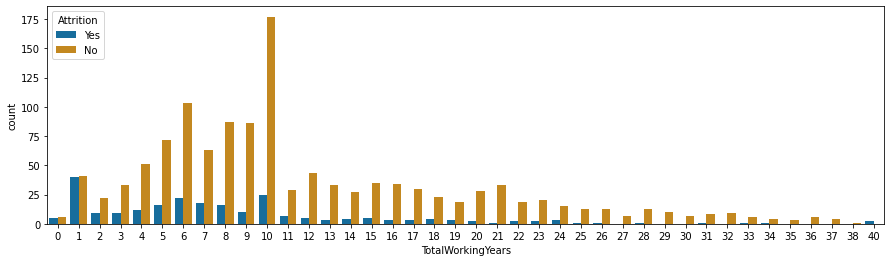

In [111]:
plt.subplots(figsize=(15,4))
sns.countplot(x="TotalWorkingYears", hue="Attrition", data=df, palette="colorblind")

We see that the lower the years of work the higher the rate of attrtion , so younger people are leaving the company more often than the old

<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='Density'>

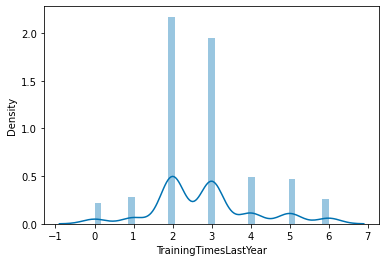

In [112]:
sns.distplot(df['TrainingTimesLastYear'],kde=True )

<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='Count'>

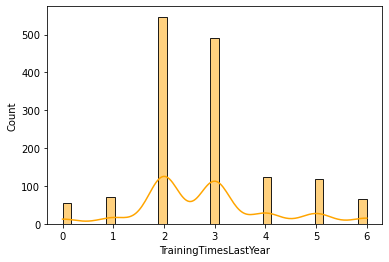

In [113]:
sns.histplot(df['TrainingTimesLastYear'],kde=True,color='orange')

<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='count'>

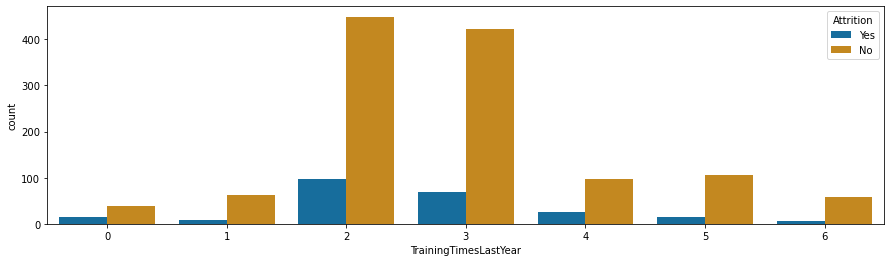

In [114]:
plt.subplots(figsize=(15,4))
sns.countplot(x="TrainingTimesLastYear", hue="Attrition", data=df, palette="colorblind")

<AxesSubplot:xlabel='WorkLifeBalance', ylabel='Density'>

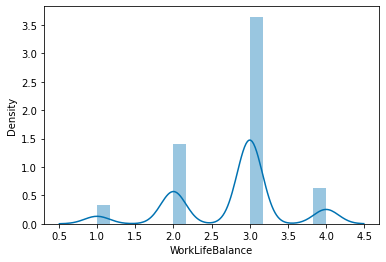

In [115]:
sns.distplot(df['WorkLifeBalance'],kde=True )

<AxesSubplot:xlabel='WorkLifeBalance', ylabel='Count'>

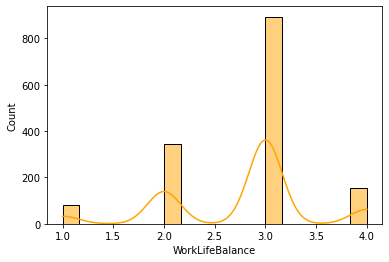

In [116]:
sns.histplot(df['WorkLifeBalance'],kde=True,color='orange')

<AxesSubplot:xlabel='WorkLifeBalance', ylabel='count'>

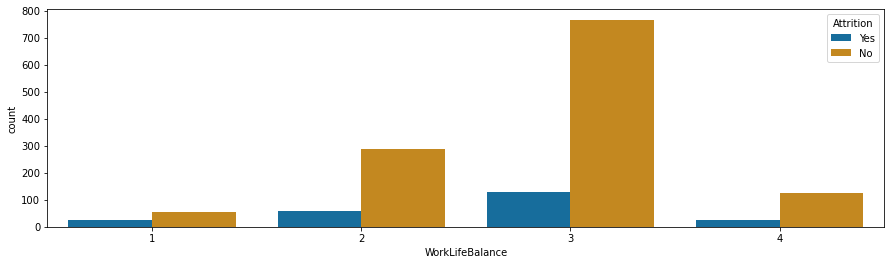

In [117]:
plt.subplots(figsize=(15,4))
sns.countplot(x="WorkLifeBalance", hue="Attrition", data=df, palette="colorblind")

this column is categorical in nature and the max of the employees are in 3 and least in 1 which means the company values balance

<AxesSubplot:xlabel='YearsAtCompany', ylabel='Density'>

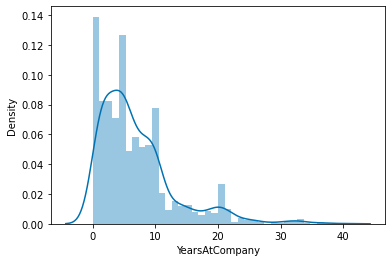

In [118]:
sns.distplot(df['YearsAtCompany'],kde=True )

<AxesSubplot:xlabel='YearsAtCompany', ylabel='Count'>

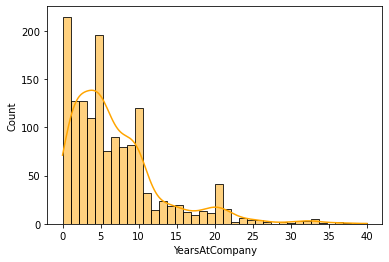

In [119]:
sns.histplot(df['YearsAtCompany'],kde=True,color='orange')

<AxesSubplot:xlabel='YearsAtCompany', ylabel='count'>

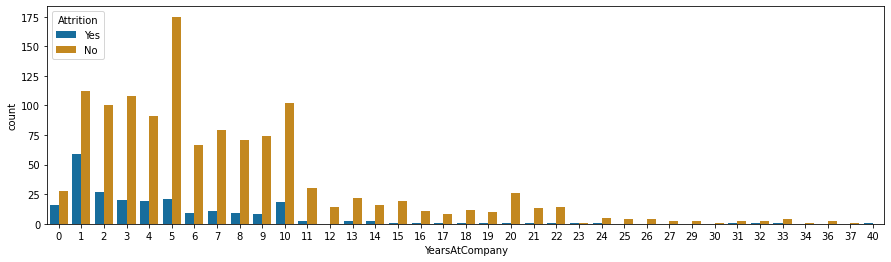

In [120]:
plt.subplots(figsize=(15,4))
sns.countplot(x="YearsAtCompany", hue="Attrition", data=df, palette="colorblind")

We see that the max employyes are 0 years and 5 years in the company and least 40

<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='Density'>

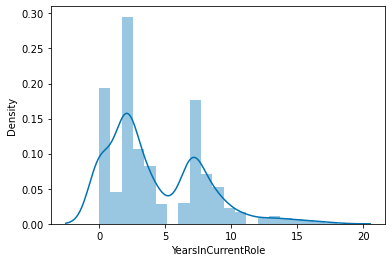

In [121]:
sns.distplot(df['YearsInCurrentRole'],kde=True )

<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='Count'>

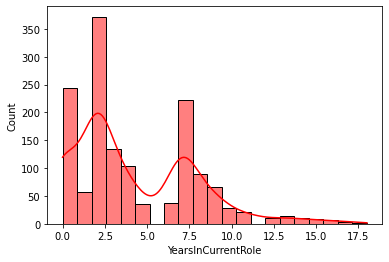

In [122]:
sns.histplot(df['YearsInCurrentRole'],kde=True,color='r')

<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='count'>

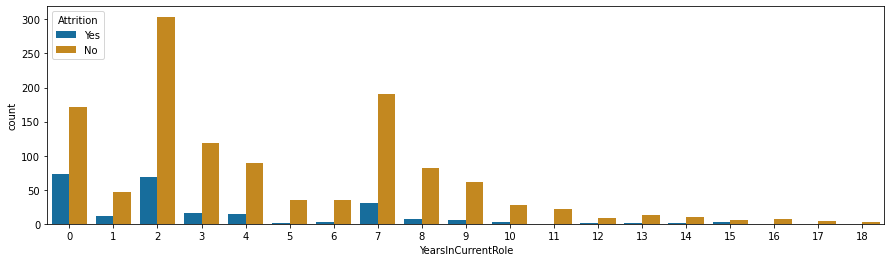

In [123]:
plt.subplots(figsize=(15,4))
sns.countplot(x="YearsInCurrentRole", hue="Attrition", data=df, palette="colorblind")

We see that there is equal level of attrition in the range between 0-2 and then it drops so early the assosaites are leaving more

<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='Density'>

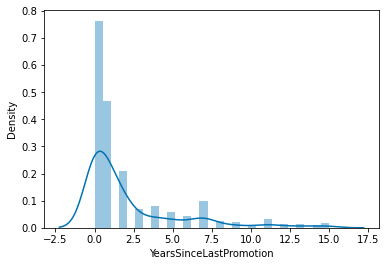

In [124]:
sns.distplot(df['YearsSinceLastPromotion'],kde=True )

<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='Count'>

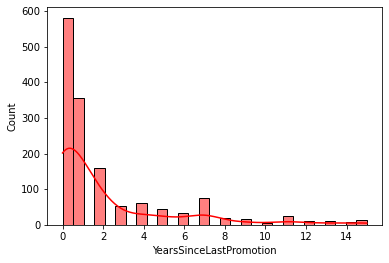

In [125]:
sns.histplot(df['YearsSinceLastPromotion'],kde=True,color='red')

<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='count'>

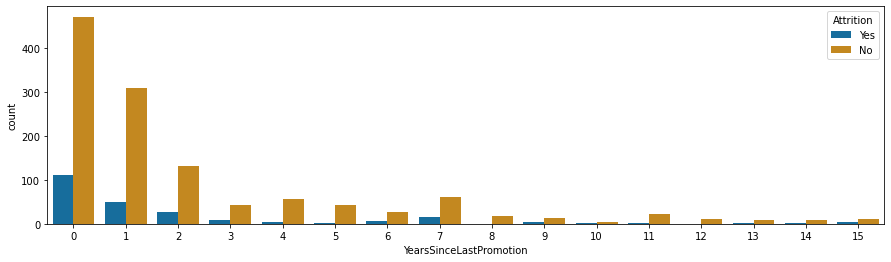

In [126]:
plt.subplots(figsize=(15,4))
sns.countplot(x="YearsSinceLastPromotion", hue="Attrition", data=df, palette="colorblind")

We see higher number with people who have 0 years since last promotion which means they are leaving as soon as they get the promotion from the company

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='Density'>

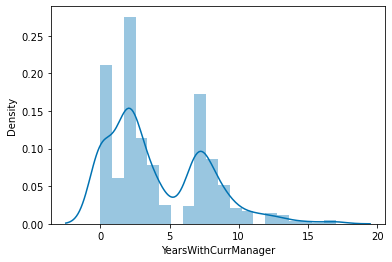

In [127]:
sns.distplot(df['YearsWithCurrManager'],kde=True )

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='Count'>

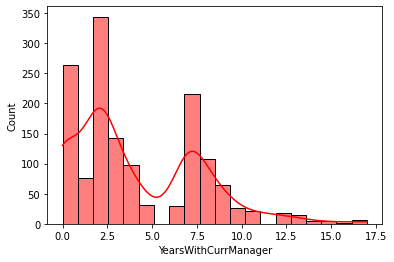

In [128]:
sns.histplot(df['YearsWithCurrManager'],kde=True,color='r')

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='count'>

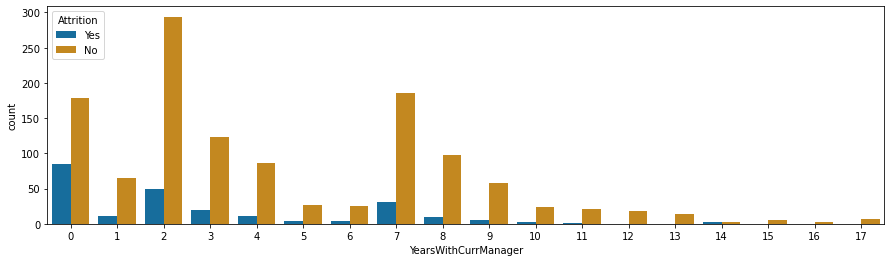

In [129]:
plt.subplots(figsize=(15,4))
sns.countplot(x="YearsWithCurrManager", hue="Attrition", data=df, palette="colorblind")

Again we see that people with 0 years and till 1 with manager are leaving more that the rest who are there longer with the manager so early joiners are leaving early in their career

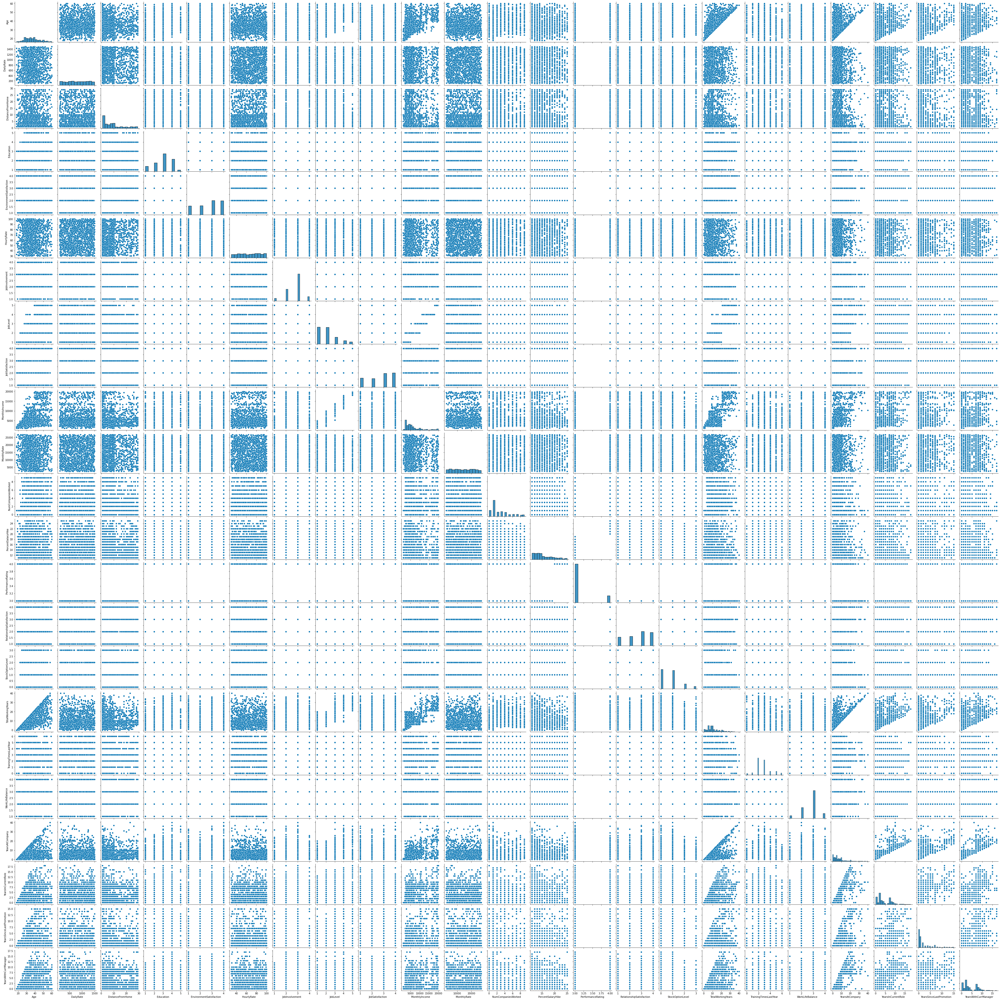

In [130]:
sns.pairplot(df)

### Observation: 
    
    The relationship is very hard to pinpoint so we will need to plot different relationship plots to find the actual relationship between the columns

### Visualization of the categorical features

In [131]:
df_visualization_nominal.columns # nominal features

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'OverTime'],
      dtype='object')

In [132]:
import plotly.graph_objs as go
import plotly.offline as py
attrition = df[(df['Attrition'] != 0)]
no_attrition = df[(df['Attrition'] == 0)]

trace = go.Pie(labels = ['No_attrition', 'Yes_attrition'], values = df['Attrition'].value_counts(), 
               textfont=dict(size=15),
               marker=dict(colors=['blue','red'], 
               line=dict(color='brown', width=1.5)))
layout = dict(title =  'Distribution of attrition variable')          
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

No     1233
Yes     237
Name: Attrition, dtype: int64


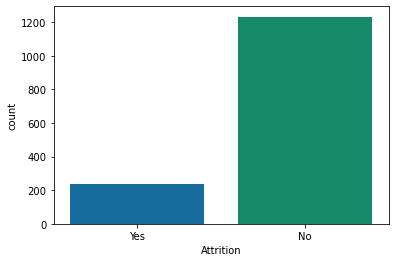

In [133]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='Attrition',data = df_visualization_nominal)
print(df_visualization_nominal['Attrition'].value_counts())

Observations:-   
- we see that it is an imbalanced dataset where the NO is over powering the YES so if we base our model on this , it will defenity be a biased model ,
- we also see that the columns is object data so we need to treat that as well

DistanceFromHome [ 1  8  2  3 24 23 27 16 15 26 19 21  5 11  9  7  6 10  4 25 12 18 29 22
 14 20 28 17 13]
Education [2 1 4 3 5]
EnvironmentSatisfaction [2 3 4 1]
JobInvolvement [3 2 4 1]
JobLevel [2 1 3 4 5]
JobSatisfaction [4 2 3 1]
NumCompaniesWorked [8 1 6 9 0 4 5 2 7 3]
PercentSalaryHike [11 23 15 12 13 20 22 21 17 14 16 18 19 24 25]
PerformanceRating [3 4]
RelationshipSatisfaction [1 4 2 3]
StockOptionLevel [0 1 3 2]
TrainingTimesLastYear [0 3 2 5 1 4 6]
WorkLifeBalance [1 3 2 4]
YearsInCurrentRole [ 4  7  0  2  5  9  8  3  6 13  1 15 14 16 11 10 12 18 17]
YearsSinceLastPromotion [ 0  1  3  2  7  4  8  6  5 15  9 13 12 10 11 14]
YearsWithCurrManager [ 5  7  0  2  6  8  3 11 17  1  4 12  9 10 15 13 16 14]


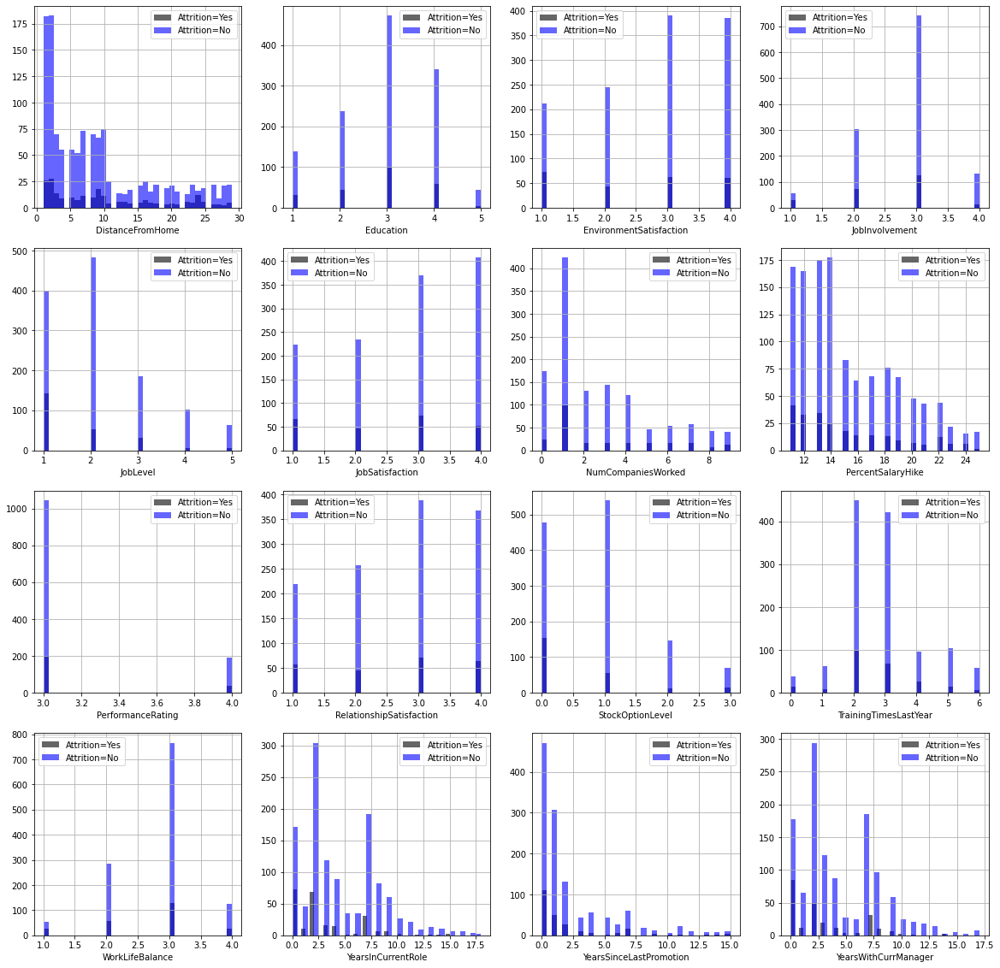

In [134]:
num_col=[]
for i in df.columns:
    if(df[i].dtypes!=object and df[i].nunique()<30):
        print(i, df[i].unique())
        num_col.append(i)
        
        
plt.figure(figsize=(20,20))
for i, column in enumerate(num_col,1):
    plt.subplot(4,4,i)
    df[df['Attrition']=='Yes'][column].hist(bins=36,color='black',label="Attrition=Yes",alpha=0.6)
    df[df['Attrition']=='No'][column].hist(bins=36,color='blue',label="Attrition=No",alpha=0.6)
    plt.xlabel(column)
    plt.legend()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


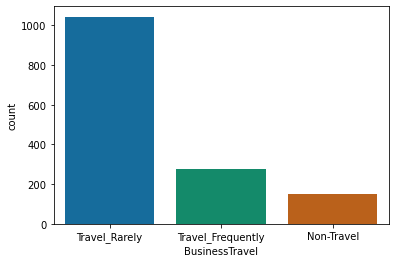

In [135]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='BusinessTravel',data = df_visualization_nominal)
print(df_visualization_nominal['BusinessTravel'].value_counts())

<AxesSubplot:xlabel='BusinessTravel', ylabel='count'>

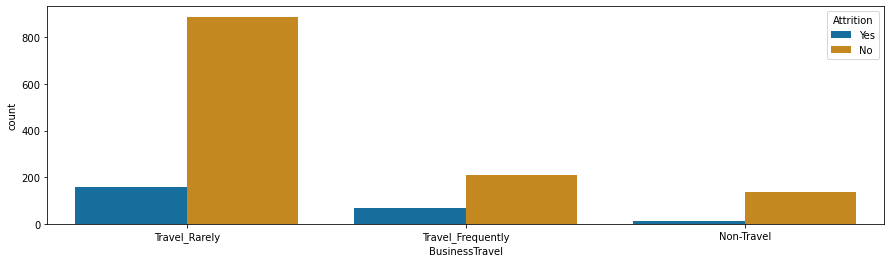

In [136]:
plt.subplots(figsize=(15,4))
sns.countplot(x="BusinessTravel", hue="Attrition", data=df, palette="colorblind")

We see that people who do travel seen to leave the company more , and the others are less

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


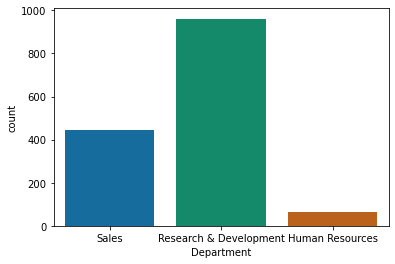

In [137]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='Department',data = df_visualization_nominal)
print(df_visualization_nominal['Department'].value_counts())

<AxesSubplot:xlabel='Department', ylabel='count'>

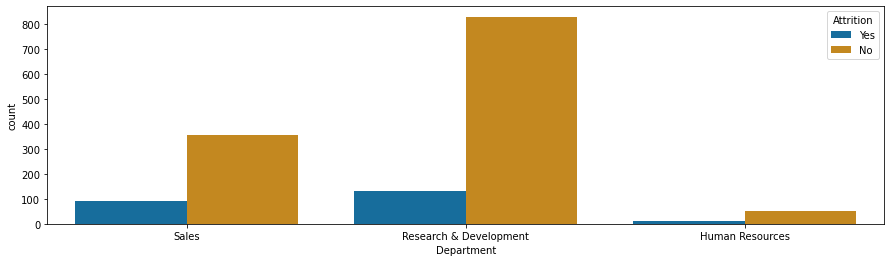

In [138]:
plt.subplots(figsize=(15,4))
sns.countplot(x="Department", hue="Attrition", data=df, palette="colorblind")

We see that Research and development has the higher chunck of ex employees and according to the ratio we see sales have more attrition

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


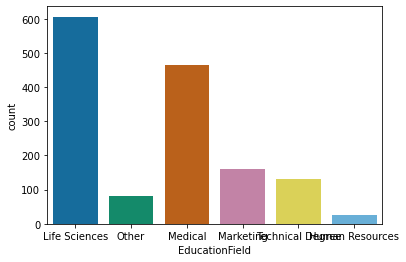

In [139]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='EducationField',data = df_visualization_nominal)
print(df_visualization_nominal['EducationField'].value_counts())

<AxesSubplot:xlabel='EducationField', ylabel='count'>

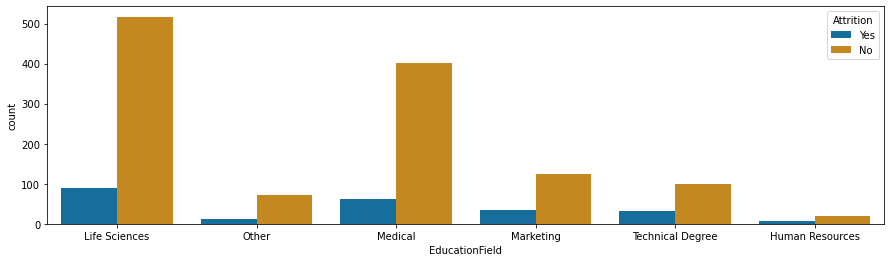

In [140]:
plt.subplots(figsize=(15,4))
sns.countplot(x="EducationField", hue="Attrition", data=df, palette="colorblind")

we see that there is approx equal attrition levels accross the education level highest being life sciences but the ratio is lower compared to HR in total

Male      882
Female    588
Name: Gender, dtype: int64


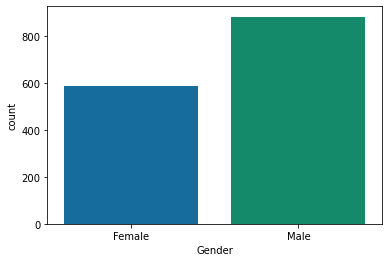

In [141]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='Gender',data = df_visualization_nominal)
print(df_visualization_nominal['Gender'].value_counts())

<AxesSubplot:xlabel='Gender', ylabel='count'>

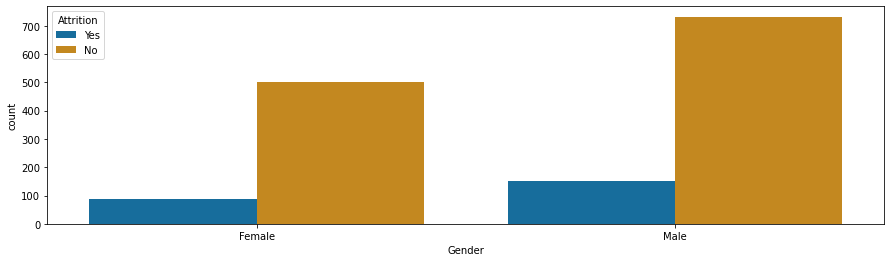

In [142]:
plt.subplots(figsize=(15,4))
sns.countplot(x="Gender", hue="Attrition", data=df, palette="colorblind")

We see that males are leaving more than females in the company

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


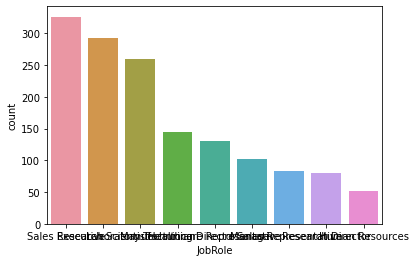

In [143]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='JobRole',data = df_visualization_nominal)
print(df_visualization_nominal['JobRole'].value_counts())

<AxesSubplot:xlabel='JobRole', ylabel='count'>

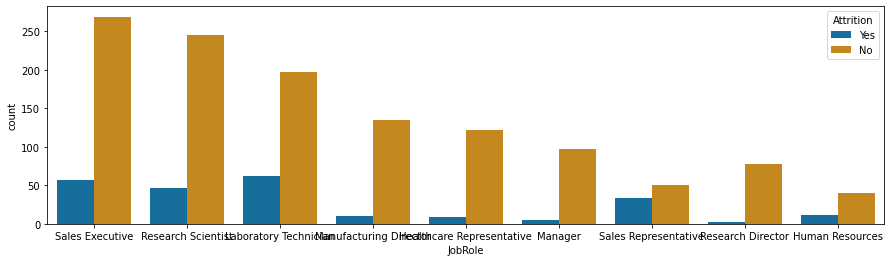

In [144]:
plt.subplots(figsize=(15,4))
sns.countplot(x="JobRole", hue="Attrition", data=df, palette="colorblind")

We see high Attrition among the Sales Executives in the company and we see that the Lab technitian role is having the highest attrition levels

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


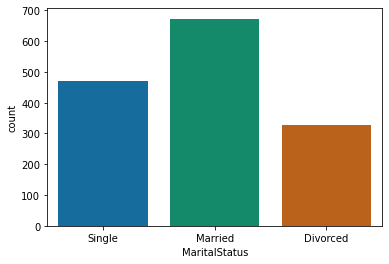

In [145]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='MaritalStatus',data = df_visualization_nominal)
print(df_visualization_nominal['MaritalStatus'].value_counts())

<AxesSubplot:xlabel='MaritalStatus', ylabel='count'>

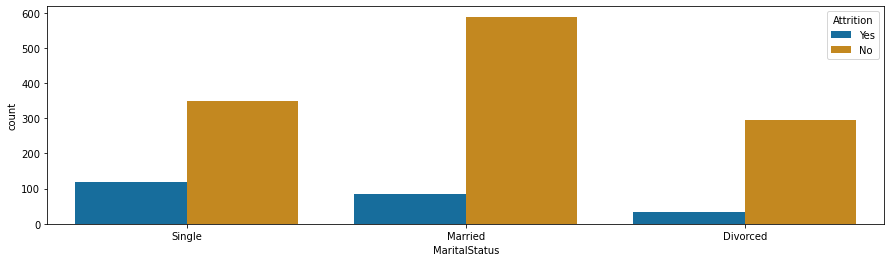

In [146]:
plt.subplots(figsize=(15,4))
sns.countplot(x="MaritalStatus", hue="Attrition", data=df, palette="colorblind")

We see that the Single category has the higher attrition rate when we compared the ratio between current in each class , overall Married has the highest number of ex employees

No     1054
Yes     416
Name: OverTime, dtype: int64


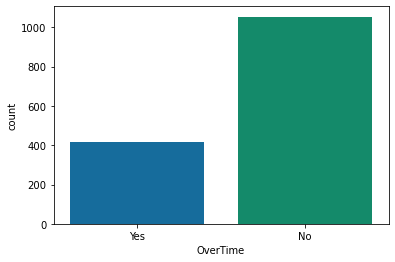

In [147]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='OverTime',data = df_visualization_nominal)
print(df_visualization_nominal['OverTime'].value_counts())

<AxesSubplot:xlabel='OverTime', ylabel='count'>

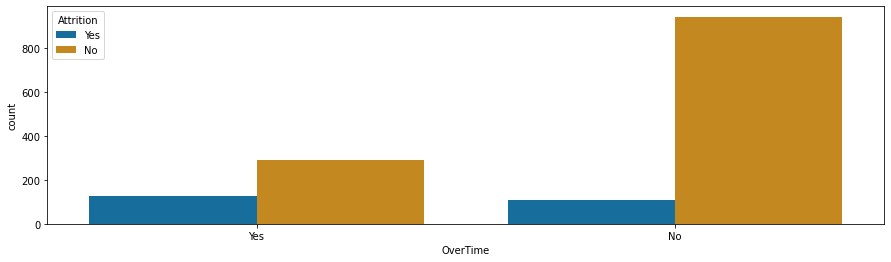

In [148]:
plt.subplots(figsize=(15,4))
sns.countplot(x="OverTime", hue="Attrition", data=df, palette="colorblind")

We see that according to ration more people who dont do overtime tend to leave and people who do dont leave

### Encoding the categorical Features to numerical features

In [149]:
# treating target variable as its object data

df['Attrition'] = df['Attrition'].factorize(['No','Yes'])[0]

df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,...,3,3,1,17,3,3,5,2,0,3
1466,39,0,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,...,3,1,1,9,5,3,7,7,1,7
1467,27,0,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,...,4,2,1,6,0,3,6,2,0,3
1468,49,0,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,...,3,4,0,17,3,2,9,6,0,8


Treating the ordinal data of Job role as each role has different weightage

In [150]:
df['JobRole'].unique()

array(['Sales Executive', 'Research Scientist', 'Laboratory Technician',
       'Manufacturing Director', 'Healthcare Representative', 'Manager',
       'Sales Representative', 'Research Director', 'Human Resources'],
      dtype=object)

In [151]:
df.replace({'Healthcare Representative':0,'Sales Representative':1,'Laboratory Technician':2,'Sales Executive':3,'Research Scientist':4,'Manager':5,'Human Resources':6,'Research Director':7,'Manufacturing Director':8},inplace=True)

In [152]:
from sklearn.preprocessing import LabelEncoder
enc=LabelEncoder()

In [153]:
for i in df_visualization_nominal.columns:
    if df_visualization_nominal[i].dtypes == "object":
        df_visualization_nominal[i]=enc.fit_transform(df_visualization_nominal[i].values.reshape(-1,1))


In [154]:
df_visualization_nominal.drop(columns=['Attrition','JobRole'],inplace=True)

In [155]:
df.drop(columns=['BusinessTravel','Department','EducationField','Gender','MaritalStatus','OverTime'],inplace=True)

In [156]:
df = pd .concat([df,df_visualization_nominal],axis=1)

In [157]:
df

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobRole,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel,Department,EducationField,Gender,MaritalStatus,OverTime
0,41,1,1102,1,2,2,94,3,2,3,...,6,4,0,5,2,2,1,0,2,1
1,49,0,279,8,1,3,61,2,2,4,...,10,7,1,7,1,1,1,1,1,0
2,37,1,1373,2,2,4,92,2,1,2,...,0,0,0,0,2,1,4,1,2,1
3,33,0,1392,3,4,4,56,3,1,4,...,8,7,3,0,1,1,1,0,1,1
4,27,0,591,2,1,1,40,3,1,2,...,2,2,2,2,2,1,3,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,884,23,2,3,41,4,2,2,...,5,2,0,3,1,1,3,1,1,0
1466,39,0,613,6,1,4,42,2,3,0,...,7,7,1,7,2,1,3,1,1,0
1467,27,0,155,4,3,2,87,4,2,8,...,6,2,0,3,2,1,1,1,1,1
1468,49,0,1023,2,3,4,63,2,2,3,...,9,6,0,8,1,2,3,1,1,0


In [158]:
df.dtypes

Age                         int64
Attrition                   int64
DailyRate                   int64
DistanceFromHome            int64
Education                   int64
EnvironmentSatisfaction     int64
HourlyRate                  int64
JobInvolvement              int64
JobLevel                    int64
JobRole                     int64
JobSatisfaction             int64
MonthlyIncome               int64
MonthlyRate                 int64
NumCompaniesWorked          int64
PercentSalaryHike           int64
PerformanceRating           int64
RelationshipSatisfaction    int64
StockOptionLevel            int64
TotalWorkingYears           int64
TrainingTimesLastYear       int64
WorkLifeBalance             int64
YearsAtCompany              int64
YearsInCurrentRole          int64
YearsSinceLastPromotion     int64
YearsWithCurrManager        int64
BusinessTravel              int32
Department                  int32
EducationField              int32
Gender                      int32
MaritalStatus 

We have converted the categorical data to numerical data we can move ahead to the next step

### Visualizing the relationship between the features and the target variable - Attrition

In [159]:
#Divide data into features and label

x = df.drop(columns = ['Attrition'])
y = df['Attrition']

In [160]:
x

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel,Department,EducationField,Gender,MaritalStatus,OverTime
0,41,1102,1,2,2,94,3,2,3,4,...,6,4,0,5,2,2,1,0,2,1
1,49,279,8,1,3,61,2,2,4,2,...,10,7,1,7,1,1,1,1,1,0
2,37,1373,2,2,4,92,2,1,2,3,...,0,0,0,0,2,1,4,1,2,1
3,33,1392,3,4,4,56,3,1,4,3,...,8,7,3,0,1,1,1,0,1,1
4,27,591,2,1,1,40,3,1,2,2,...,2,2,2,2,2,1,3,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,3,41,4,2,2,4,...,5,2,0,3,1,1,3,1,1,0
1466,39,613,6,1,4,42,2,3,0,1,...,7,7,1,7,2,1,3,1,1,0
1467,27,155,4,3,2,87,4,2,8,2,...,6,2,0,3,2,1,1,1,1,1
1468,49,1023,2,3,4,63,2,2,3,2,...,9,6,0,8,1,2,3,1,1,0


In [161]:
y

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1470, dtype: int64

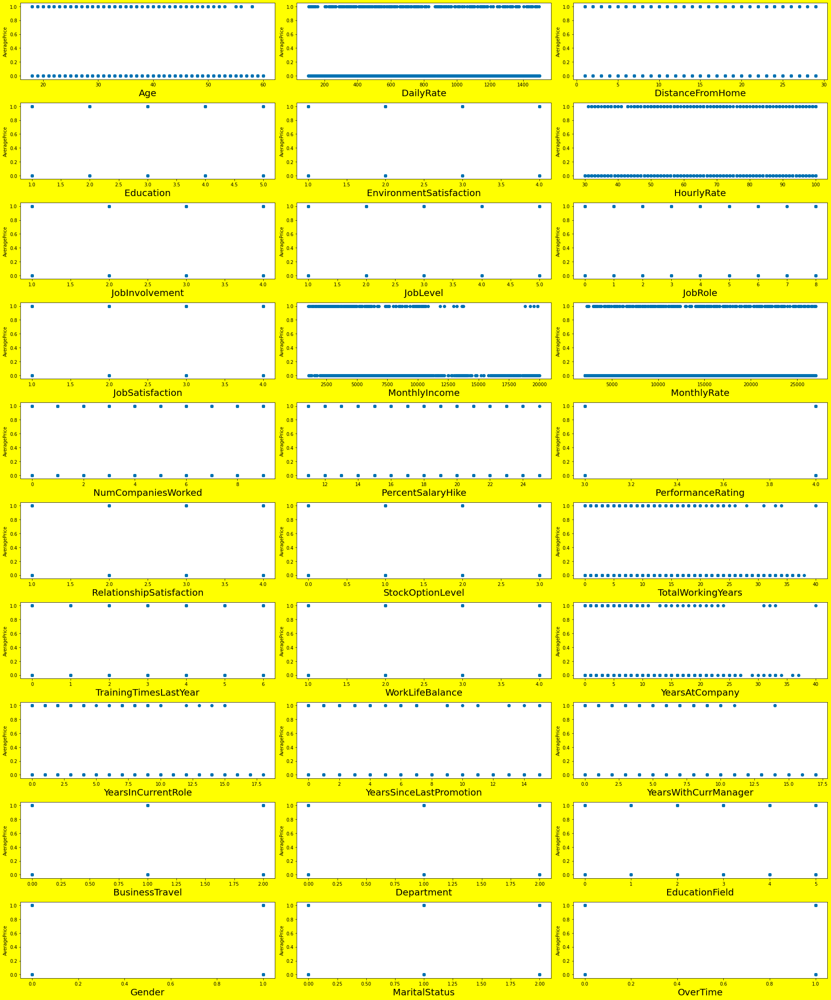

In [162]:
#Visualizing Relationship Scatter plot

plt.figure(figsize =(25,30), facecolor = 'yellow')
plotnumber = 1

for column in x:
    if plotnumber <=30:
        ax = plt.subplot(10,3,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column,fontsize = 20)
        plt.ylabel('AveragePrice',fontsize = 10)
    plotnumber +=1
plt.tight_layout()



# Observations:-
- we see that the relationship of all the columns are  uniform , 
- we also see that there are some columns which are 
not showing a uniform no relationship  
- we feel that this is not a good graph to show the relationship moving to next

### Describing the Dataset

In [163]:
df.describe()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobRole,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel,Department,EducationField,Gender,MaritalStatus,OverTime
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,0.161224,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,3.597959,...,7.008163,4.229252,2.187755,4.123129,1.607483,1.260544,2.247619,0.600000,1.097279,0.282993
std,9.135373,0.367863,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,2.231862,...,6.126525,3.623137,3.222430,3.568136,0.665455,0.527792,1.331369,0.490065,0.730121,0.450606
min,18.000000,0.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,...,3.000000,2.000000,0.000000,2.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000
50%,36.000000,0.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,...,5.000000,3.000000,1.000000,3.000000,2.000000,1.000000,2.000000,1.000000,1.000000,0.000000
75%,43.000000,0.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,5.000000,...,9.000000,7.000000,3.000000,7.000000,2.000000,2.000000,3.000000,1.000000,2.000000,1.000000
max,60.000000,1.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,8.000000,...,40.000000,18.000000,15.000000,17.000000,2.000000,2.000000,5.000000,1.000000,2.000000,1.000000


<AxesSubplot:>

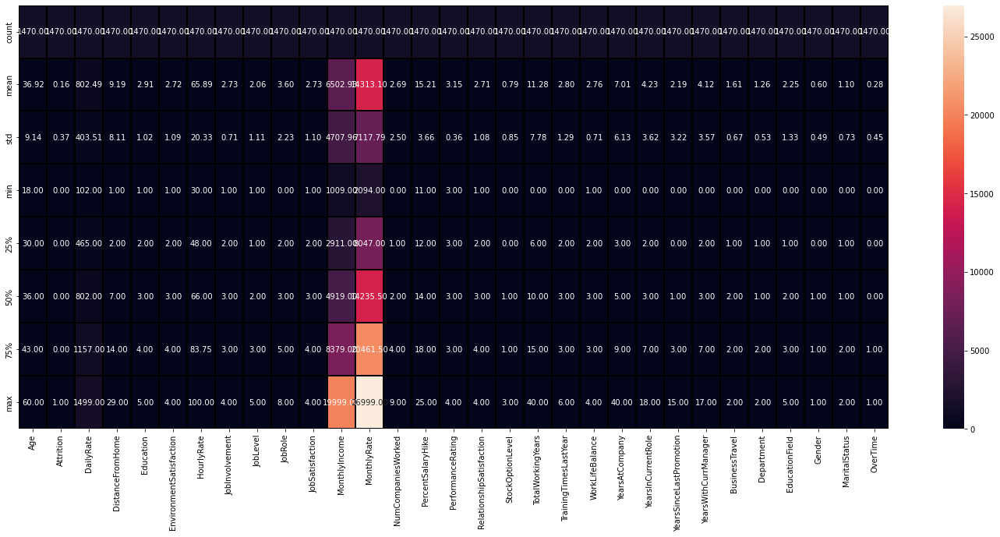

In [164]:
#Visualization of HeatMap

#Lets see how the data is distributed for every column

import matplotlib.pyplot as plt
plt.figure(figsize=(25,10))
sns.heatmap(df.describe(),annot=True,linewidths=0.1,linecolor="black",fmt='0.2f')

Monthly rate and Monthly income have some extreme values which we need to scale so that the model does not become biased

In [165]:
df.skew()

Age                         0.413286
Attrition                   1.844366
DailyRate                  -0.003519
DistanceFromHome            0.958118
Education                  -0.289681
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                     0.481704
JobSatisfaction            -0.329672
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     1.984290
YearsWithCurrManager        0.833451
BusinessTravel             -1.439006
Department                  0.172231
E

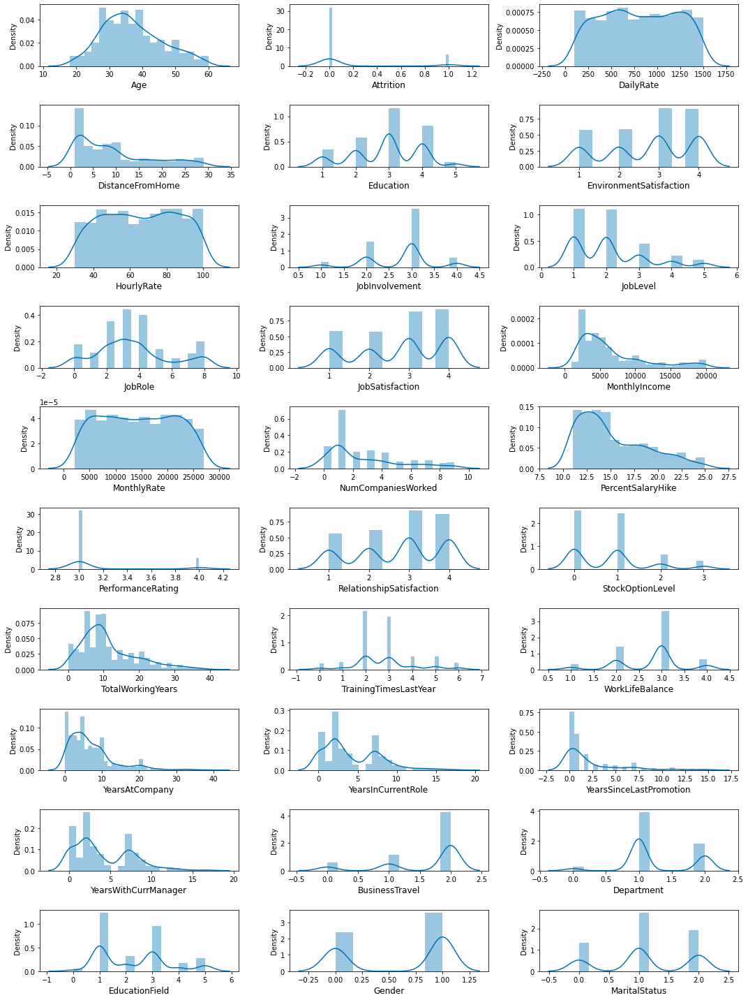

In [166]:
#Lets see how the data is distributed for every column after the treatment

plt.figure(figsize =(15,20), facecolor = 'white')
plotnumber = 1

for column in df:
    if plotnumber <=30:
        ax = plt.subplot(10,3,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize = 12)
        
    plotnumber +=1
plt.tight_layout()

Correlation of the columns with the 1st target variable -AveragePrice

In [167]:
df.corr()['Attrition'].sort_values()

TotalWorkingYears          -0.171063
JobLevel                   -0.169105
YearsInCurrentRole         -0.160545
MonthlyIncome              -0.159840
Age                        -0.159205
YearsWithCurrManager       -0.156199
StockOptionLevel           -0.137145
YearsAtCompany             -0.134392
JobInvolvement             -0.130016
JobRole                    -0.120818
JobSatisfaction            -0.103481
EnvironmentSatisfaction    -0.103369
WorkLifeBalance            -0.063939
TrainingTimesLastYear      -0.059478
DailyRate                  -0.056652
RelationshipSatisfaction   -0.045872
YearsSinceLastPromotion    -0.033019
Education                  -0.031373
PercentSalaryHike          -0.013478
HourlyRate                 -0.006846
BusinessTravel              0.000074
PerformanceRating           0.002889
MonthlyRate                 0.015170
EducationField              0.026846
Gender                      0.029453
NumCompaniesWorked          0.043494
Department                  0.063991
D

Overall the rest of the columns show very less correaltion or negative correlation with the target

### Heatmap of Correlation of the columns within the Columns or Features and Target¶

<AxesSubplot:>

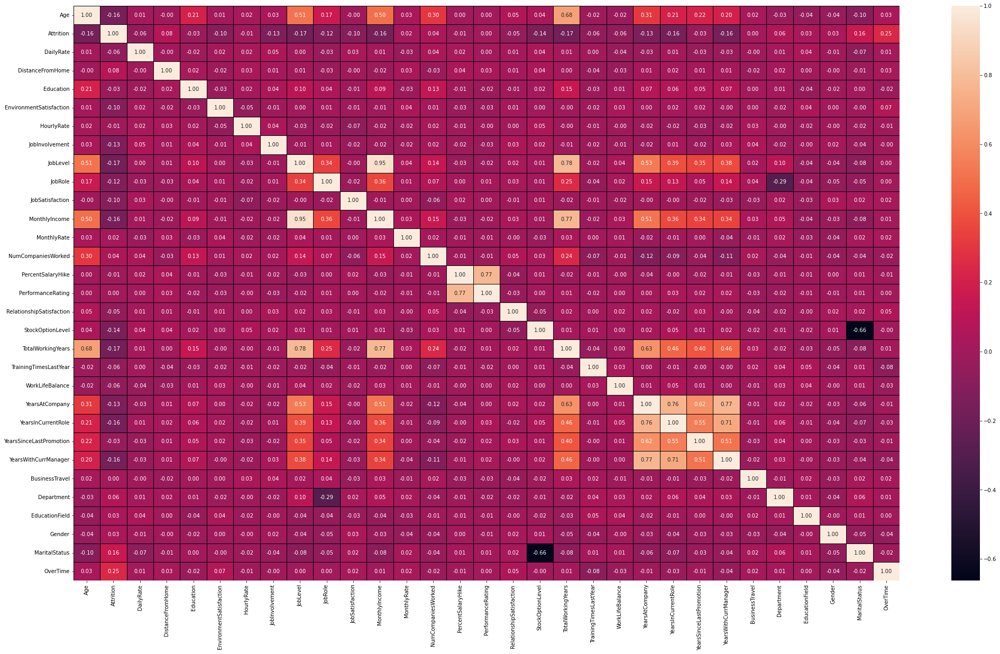

In [168]:
#size of canvas
plt.figure(figsize=(35,20))
sns.heatmap(df.corr(),annot=True, linewidths=0.5,linecolor='black', fmt='.2f')

### Observations:
we see that Total Working years and Age are 68% correlated and Monthly income and Job level is approx 50-51% correlated

we see that JOblevel and Total Working hours , and Years at company having more than 50% correlation

we see that Monthly income and years at company and total working years to have more than 50% correlation

years with Company and years with manager and Years since last promotion and Years in current role have more than 50% correaltion

These are not having very high correlation and we want to use the data to see if it gives some much needed data to the model we are building

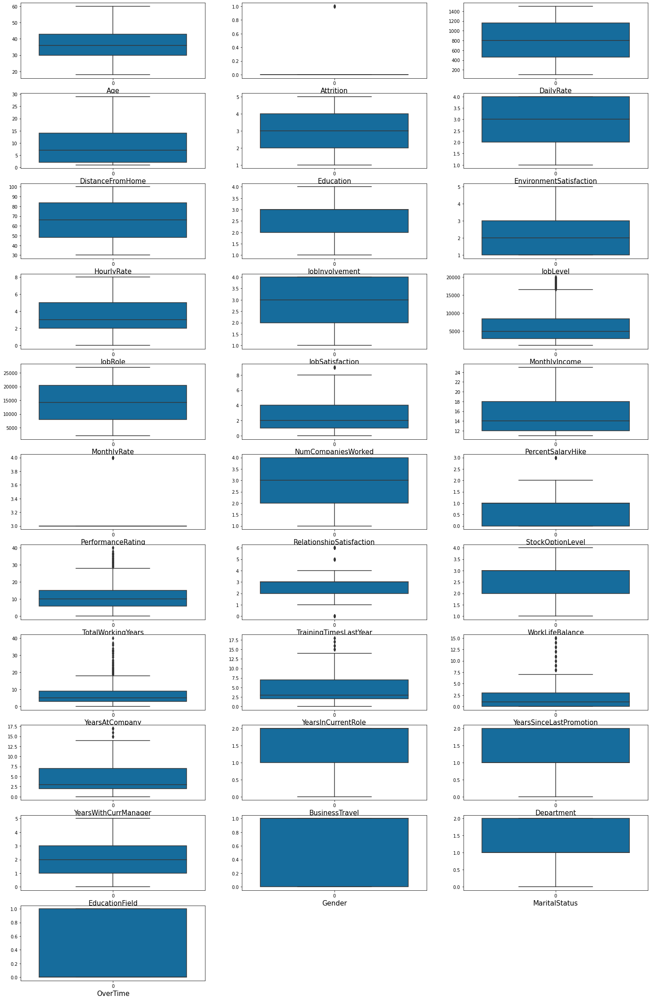

In [169]:
#Checking for Outliers
#Lets visualize the data
plt.figure(figsize =(25,40))
graph = 1

for column in df:
    if graph <=31: # as there are 9 columns in data
        plt.subplot(11,3,graph)
        ax=sns.boxplot(data=df[column])
        plt.xlabel(column,fontsize = 15)
        
    graph +=1
plt.show()

We see that the most outliers is in the categorical columns so we will not treat that, we see some outliers in Monthly income we will scale th data and treat that

<AxesSubplot:>

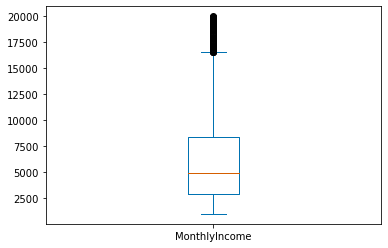

In [170]:
#As we are not able to see clearly unlesss we zoom , checking individualy

df['MonthlyIncome'].plot.box()

### Using SelectKBest Feature Selection Method -1st Target - AveragePrice

In [171]:
# we Divide data into features and label

X = df.drop(columns = ['Attrition'])
y = df['Attrition']

In [172]:
from sklearn.feature_selection import SelectKBest, f_classif

In [ ]:
best_features = SelectKBest(score_func = f_classif, k=30)

fit = best_features.fit(X,y)

df_scores = pd.DataFrame(fit.scores_)

df_columns = pd.DataFrame(X.columns)


#concatenate dataframes

feature_scores = pd.concat([df_columns, df_scores], axis = 1)

feature_scores.columns = ['Feature_name', 'Score']   #name output columns

print(feature_scores.nlargest(30,'Score'))  #Print Best 4 features

We see that after we have skewed the data , the values are lesser for all the columns so we will not remove any columns and move to the next step

### Variance Inflation Factor

Checking for Multicollinearity problem to see if one feature is dependent on the other , we need to scale the dat first using MINMAX Scalar

In [175]:
from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()

In [176]:
X_scaled = mms.fit_transform(X)

In [177]:
X_scaled.shape

(1470, 30)

In [178]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(X_scaled, i) for i in range(X_scaled.shape[1])]
vif["Features"] = X.columns

#chck Values
vif

,vif,Features
0,10.656724,Age
1,3.949079,DailyRate
2,2.029283,DistanceFromHome
3,4.660057,Education
4,3.435605,EnvironmentSatisfaction
5,4.051996,HourlyRate
6,6.593824,JobInvolvement
7,21.935329,JobLevel
8,4.446401,JobRole
9,3.392149,JobSatisfaction


### Principal Component Analysis (PCA)
It is a dimension reduction technique. it is mainly used if there are too many features and no correlation with the target but its the final analysis we are going to do to chcek for multicollinearity problem


In [173]:
from sklearn.decomposition import PCA
pca = PCA()

In [179]:
pca.fit_transform(X_scaled) #To scale the data with PCA so we can plot the graph to see whats the coverage 

array([[ 4.92072233e-01, -6.81853119e-01,  4.59218196e-01, ...,
        -1.24217508e-01,  6.91117936e-02,  3.13034568e-03],
       [-2.80095701e-01,  3.23271746e-01, -1.84570221e-01, ...,
        -1.31220723e-01,  3.33746103e-02,  3.25196365e-02],
       [-5.70163635e-01, -4.14162241e-01,  7.25036415e-01, ...,
        -2.22043430e-04,  2.43672137e-03,  1.70780627e-02],
       ...,
       [-2.64239187e-01,  3.66217034e-02,  6.46984755e-01, ...,
         2.61548930e-02,  5.46790284e-02,  2.85382440e-02],
       [-2.39157928e-01,  3.72509872e-01, -1.03772461e-01, ...,
         1.18849436e-02, -5.10735575e-02,  8.07732527e-03],
       [-5.30901616e-01,  8.40500444e-02, -2.96976135e-01, ...,
        -6.35818472e-02,  1.56715287e-02,  7.80990768e-02]])

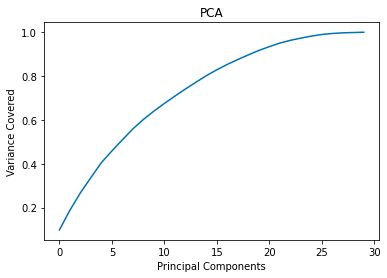

In [181]:
# lets plot scree plot to check the best components

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel("Variance Covered")
plt.title('PCA')
plt.show()

We see that in order to cover 95% - 100% of the data we need to have only have 20 features and we can remove the rest , We will use the Kbest to decide which features are the best and see if we should remove any feautes , But at this pint we will move ahead

### Creating the Model for 1st Label-AveragePrice - Choosing the Best Model

#### Over Sampling using SMOTE

In [182]:
y.value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

As we see the dataset is imbalanced and we need to treat this or the model will give a good score but will be biased

In [183]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size = 0.75,random_state = 76)

In [184]:
from collections import Counter
Counter(y_train)

Counter({0: 928, 1: 174})

In [197]:
from imblearn.over_sampling import SMOTE


sm = SMOTE()

ove_smp = SMOTE()

X_train_ns,y_train_ns= sm.fit_resample(X_train,y_train) # using resample as the sample did not work

print("The number of classes before fit {}".format(Counter(y_train)))
print("The number of classes after fit {}".format(Counter(y_train_ns)))

The number of classes before fit Counter({0: 928, 1: 174})
The number of classes after fit Counter({0: 928, 1: 928})


In [190]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_ns = pd.DataFrame(scaler.fit_transform(X_train_ns), columns = X_train.columns)
X_test= pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)
X_train_ns

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel,Department,EducationField,Gender,MaritalStatus,OverTime
0,0.462986,0.090750,-0.983040,-0.764219,0.533798,-1.465937,1.972908,0.129533,-1.622944,-0.505795,...,0.270448,1.012016,0.316230,1.059137,-0.771754,-0.323507,0.704509,-1.031754,-0.120777,-0.631382
1,-1.057711,-1.087849,-0.983040,0.262856,-1.335503,-0.439473,0.640405,-0.828289,0.352583,-1.454991,...,-0.536030,-0.469762,-0.338818,-0.448578,-0.771754,-0.323507,-0.905797,0.969223,-0.120777,1.583827
2,0.680229,-0.318741,-1.117156,-1.791295,-0.400852,1.829554,0.640405,0.129533,-0.141299,0.443401,...,2.205994,3.679216,2.936424,0.757594,0.743987,1.619627,-0.905797,0.969223,-0.120777,-0.631382
3,-0.514605,0.096000,1.431058,0.262856,0.533798,0.100772,1.972908,-0.828289,-1.129062,1.392597,...,-0.697325,-0.469762,-0.011294,-0.448578,-0.771754,1.619627,-0.905797,0.969223,-0.120777,-0.631382
4,-1.600817,1.539717,1.699291,-1.791295,0.533798,-0.871668,0.640405,-0.828289,-1.129062,0.443401,...,-0.536030,-0.469762,-0.338818,-0.448578,0.743987,1.619627,2.314814,0.969223,1.316155,-0.631382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1851,-0.840468,0.098625,0.894592,-1.791295,-0.400852,-0.439473,-0.692097,-0.828289,0.352583,-0.505795,...,-0.374734,-0.766117,-0.338818,-0.147035,0.743987,-2.266640,0.704509,-1.031754,-1.557709,-0.631382
1852,-1.274953,-1.526214,0.626359,0.262856,-0.400852,-0.925693,-0.692097,-0.828289,-0.141299,0.443401,...,-0.213438,-0.469762,0.971279,0.456051,-0.771754,-0.323507,-0.905797,-1.031754,1.316155,-0.631382
1853,0.897471,-0.355490,0.626359,-0.764219,-1.335503,0.370894,-0.692097,1.087356,-1.622944,1.392597,...,0.431744,1.012016,-0.666342,0.456051,0.743987,-0.323507,0.704509,-1.031754,-0.120777,-0.631382
1854,0.462986,0.904482,-1.117156,-0.764219,-1.335503,1.505408,0.640405,0.129533,-0.141299,0.443401,...,-0.213438,-0.173406,-0.666342,0.154508,0.743987,1.619627,-0.905797,-1.031754,-0.120777,-0.631382


### Logistic Regression

In [198]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score,classification_report
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [199]:
scores=[]
for i in range(0,100):
    X_train_ns,X_test,y_train_ns,y_test = train_test_split(X,y,test_size = 0.25,random_state = i)
    lr.fit(X_train_ns,y_train_ns)
    pred_train = lr.predict(X_train_ns)
    pred_test=lr.predict(X_test)
    print(f"At random state {i},the training accuracy is :-{accuracy_score(y_train_ns,pred_train)}")
    print(f"At random state {i},the Testing accuracy is :-{accuracy_score(y_test,pred_test)}")
    print('\n')
    scores.append(accuracy_score(y_test,pred_test))

At random state 0,the training accuracy is :-0.838475499092559
At random state 0,the Testing accuracy is :-0.845108695652174


At random state 1,the training accuracy is :-0.8511796733212341
At random state 1,the Testing accuracy is :-0.8179347826086957


At random state 2,the training accuracy is :-0.8411978221415608
At random state 2,the Testing accuracy is :-0.8342391304347826


At random state 3,the training accuracy is :-0.8411978221415608
At random state 3,the Testing accuracy is :-0.842391304347826


At random state 4,the training accuracy is :-0.8439201451905626
At random state 4,the Testing accuracy is :-0.8342391304347826


At random state 5,the training accuracy is :-0.8430127041742287
At random state 5,the Testing accuracy is :-0.8288043478260869


At random state 6,the training accuracy is :-0.8402903811252269
At random state 6,the Testing accuracy is :-0.842391304347826


At random state 7,the training accuracy is :-0.8402903811252269
At random state 7,the Testing accurac

In [200]:
# Finding the highest score using Argmax
np.argmax(scores)

26

In [201]:
scores[np.argmax(scores)]

0.8858695652173914

We are getting data:- 
     
    At random state 76,the training accuracy is :-0.8421052631578947
    
    At random state 76,the Testing accuracy is :-0.842391304347826

- the training score and Testing score are really close to each other here
- both the train and test score are really low so we cannot use this model  


### Train Test Split

In [202]:
X_train_ns,X_test,y_train_ns,y_test = train_test_split(X,y,test_size = 0.25,random_state = 76) 

# as the best random state we have chosen is 76

In [203]:
#Write one function and call as many times to check accuracy_score of different models

def metric_score(clf,X_train_ns,X_test,y_train_ns,y_test,train=True):
    if train:
        y_pred = clf.predict(X_train_ns)
        
        print("\n===============================Train Result=============================")
        
        print(f"Accuracy score : {accuracy_score(y_train_ns,y_pred) * 100: .2f}%")
        
    elif train == False:
        pred = clf.predict(X_test)
        
        print("\n===============================Test Result===============================")
        print(f"Accuracy Scorre : {accuracy_score(y_test,pred) * 100: .2f}%")
        
        
        print ('\n \n Test Classification Report \n', classification_report(y_test, pred, digits = 2)) ##Model Confidence /Accurancy
        

In [204]:
#Call the function and pass dataset to check the train score and the test score

metric_score(lr,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(lr,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  84.30%

===============================Test Result===============================
Accuracy Scorre :  83.97%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.84      1.00      0.91       305
           1       1.00      0.06      0.12        63

    accuracy                           0.84       368
   macro avg       0.92      0.53      0.52       368
weighted avg       0.87      0.84      0.78       368



We see that this model is having a pretty good score in Logistic regression , we see the train score as 84.30% and the test score as 83.97% which is pretty good considering that this is actually a small sized dataset and we have also done balancing of the label category

We see that precision score is 84& for 0 and 100% for 1 , and avg is 92% F1 score is 84% equal to test

In [206]:
print(confusion_matrix(y_test,pred_test))  

[[304   1]
 [ 63   0]]


### Cross-Validation of the model

In [207]:
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,X,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold{j} the cv score is {cv_mean} and accuracy score for training is {accuracy_score(y_train,pred_train)}and the accuracy for testing is {accuracy_score(y_test,pred_test)}")
    print('\n')

At cross fold2 the cv score is 0.8408163265306123 and accuracy score for training is 0.8421052631578947and the accuracy for testing is 0.8260869565217391


At cross fold3 the cv score is 0.8414965986394559 and accuracy score for training is 0.8421052631578947and the accuracy for testing is 0.8260869565217391


At cross fold4 the cv score is 0.842174727520436 and accuracy score for training is 0.8421052631578947and the accuracy for testing is 0.8260869565217391


At cross fold5 the cv score is 0.8408163265306122 and accuracy score for training is 0.8421052631578947and the accuracy for testing is 0.8260869565217391


At cross fold6 the cv score is 0.8401360544217688 and accuracy score for training is 0.8421052631578947and the accuracy for testing is 0.8260869565217391


At cross fold7 the cv score is 0.8394557823129251 and accuracy score for training is 0.8421052631578947and the accuracy for testing is 0.8260869565217391


At cross fold8 the cv score is 0.8421834164884772 and accuracy sc

We see that the CV score at 9 is 83.95 approx is closest to test score of 82.61 approx , there is minor difference as in the cv score should be lower but its very marginal , lets move onto other models to check as wel

### Decision Tree Classifier

In [208]:
from sklearn.tree import DecisionTreeClassifier

dt=DecisionTreeClassifier()

X_train_ns,X_test,y_train_ns,y_test = train_test_split(X,y,test_size = 0.25,random_state = 76) #as we have seen a good score on 17th state
dt.fit(X_train,y_train)
pred_train = dt.predict(X_train)
pred_test = dt.predict(X_test)
print(f"At random state {76},the training accuracy is :-{accuracy_score(y_train,pred_train)}")
print(f"At random state {76},the Testing accuracy is :-{accuracy_score(y_test,pred_test)}")
print('\n')


At random state 76,the training accuracy is :-1.0
At random state 76,the Testing accuracy is :-0.7907608695652174




In [209]:
#Call the function and pass dataset to check the train score and the test score

metric_score(dt,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(dt,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  100.00%

===============================Test Result===============================
Accuracy Scorre :  79.08%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.89      0.88       305
           1       0.37      0.32      0.34        63

    accuracy                           0.79       368
   macro avg       0.62      0.60      0.61       368
weighted avg       0.78      0.79      0.78       368



In [210]:
print(confusion_matrix(y_test,pred_test)) 

[[271  34]
 [ 43  20]]


### Observations of Decision Tree Classifier :-
- We see that the training score is boosted all the way to 100% which is the highest  but the testing score is fallen short  @ 79.08% which is lesser than the logistic model  , also we see that the F1 score is the same as test score for accuracy and precision is 86% for 0 and only 37% for 1 which is lesser than the last model 

- the model is not performing as good as Logistic regression but we cant use this model moving to the next

In [211]:
#Cross validation of the model
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(dt,X,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold{j} the cv score is {cv_mean} and accuracy score for training is {accuracy_score(y_train,pred_train)}and the accuracy for testing is {accuracy_score(y_test,pred_test)}")
    print('\n')

At cross fold2 the cv score is 0.7829931972789115 and accuracy score for training is 1.0and the accuracy for testing is 0.7907608695652174


At cross fold3 the cv score is 0.7986394557823129 and accuracy score for training is 1.0and the accuracy for testing is 0.7907608695652174


At cross fold4 the cv score is 0.7768758885203175 and accuracy score for training is 1.0and the accuracy for testing is 0.7907608695652174


At cross fold5 the cv score is 0.802721088435374 and accuracy score for training is 1.0and the accuracy for testing is 0.7907608695652174


At cross fold6 the cv score is 0.7843537414965986 and accuracy score for training is 1.0and the accuracy for testing is 0.7907608695652174


At cross fold7 the cv score is 0.7707482993197278 and accuracy score for training is 1.0and the accuracy for testing is 0.7907608695652174


At cross fold8 the cv score is 0.7809530173437871 and accuracy score for training is 1.0and the accuracy for testing is 0.7907608695652174


At cross fold9

Again we see similar Cv score and test score at 78% approx , but this is lower than the logistic regression model as we have seen

### KNN Classifier

In [212]:
from sklearn.neighbors import KNeighborsClassifier

knn=KNeighborsClassifier()

knn.fit(X_train_ns,y_train_ns)
knn.score(X_train_ns,y_train_ns)
pred_decision =knn.predict(X_test)

knns = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',knns*100)

knnscore = cross_val_score(knn,X,y,cv=9)
knnc =knnscore.mean()
print('Cross Val Score :',knnc*100)
print(confusion_matrix(y_test,pred_decision)) 

Accuracy Score : 82.06521739130434
Cross Val Score : 82.18032487073336
[[295  10]
 [ 56   7]]


In [213]:
#Call the function and pass dataset to check the train score and the test score

metric_score(knn,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(knn,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  85.93%

===============================Test Result===============================
Accuracy Scorre :  82.07%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.84      0.97      0.90       305
           1       0.41      0.11      0.18        63

    accuracy                           0.82       368
   macro avg       0.63      0.54      0.54       368
weighted avg       0.77      0.82      0.78       368



### Observations of KNN Classifier :-
- We see that the training score is lesser than Decision tree @ 85.93%   but the testing score is come equal to logistic Regression @ 82.07% 
we see that the F1 score is the not doing well where accuracy for 0 is 90% and for 1 is 18% which is bad 

- the CV score is good though and very similar to the test accuracy @ 82.18% , so overall the model is ok , but we need to improve the f1 score and precision

- we see the confusion matrix where the typ 1 and typ 2 error is 10 and 56 respectively 

### Random Forest Classifier

In [214]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()

rf.fit(X_train_ns,y_train_ns)
rf.score(X_train_ns,y_train_ns)
pred_decision =rf.predict(X_test)

rfs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',rfs*100)

rfscore = cross_val_score(rf,X,y,cv=9)
rfc =rfscore.mean()
print('Cross Val Score :',rfc*100)
print(confusion_matrix(y_test,pred_decision)) 

Accuracy Score : 85.32608695652173
Cross Val Score : 85.85091525761884
[[305   0]
 [ 54   9]]


In [215]:
#Call the function and pass dataset to check the train score and the test score

metric_score(rf,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(rf,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  100.00%

===============================Test Result===============================
Accuracy Scorre :  85.33%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.85      1.00      0.92       305
           1       1.00      0.14      0.25        63

    accuracy                           0.85       368
   macro avg       0.92      0.57      0.58       368
weighted avg       0.88      0.85      0.80       368



Observations from the Random Forest Classifier :-
- We see that like the decision tree the train score is at the max at 100% and we have test score much better at 85.33% , the F1 score is at 85% and precisiion @ 92% which is a good model , we have imbalance dataset and we treated so we have a little higher Cv score of 85.85% approx so we are getting a good cv score as well

- the model has higher error @ 54 and 0 in the confusion matrix

### XgBoost

In [216]:
import xgboost as xgb

xgb = xgb.XGBClassifier()

xgb.fit(X_train_ns,y_train_ns)
xgb.score(X_train_ns,y_train_ns)
pred_decision =xgb.predict(X_test)

xgbs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',xgbs*100)

xgbscore = cross_val_score(xgb,X,y,cv=9)
xgbc =xgbscore.mean()
print('Cross Val Score :',xgbc*100)
print(confusion_matrix(y_test,pred_decision)) 

Accuracy Score : 84.51086956521739
Cross Val Score : 87.34600229437878
[[295  10]
 [ 47  16]]


In [217]:
#Call the function and pass dataset to check the train score and the test score

metric_score(xgb,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(xgb,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  100.00%

===============================Test Result===============================
Accuracy Scorre :  84.51%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.97      0.91       305
           1       0.62      0.25      0.36        63

    accuracy                           0.85       368
   macro avg       0.74      0.61      0.64       368
weighted avg       0.82      0.85      0.82       368



### Observations of XGboost Classifier :-
- We see that the training score is again like the random forest and the decision tree at 100% and we see a very close accuracy score for test at 84.51 % which is only slightly lesser than the random forest ,we see the F1 score to be 85% again similar to rf and the precision score is 74% which is lesser than the Random forest 
The CV score is @ 87.34 which is worse than the random forest whcih had a closer cv to the test score @ 85.85% approx so overall pretty good scores from this model as well

Confusion matrix errors are 10 and 47 which is decent but we need to avoid this much of error to have a better model

## SVC

In [218]:
from sklearn.svm import SVC

svc= SVC()

svc.fit(X_train_ns,y_train_ns)
svc.score(X_train_ns,y_train_ns)
pred_decision =svc.predict(X_test)

svcs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',svcs*100)

svcscore = cross_val_score(svc,X,y,cv=9)
svcc =svcscore.mean()
print('Cross Val Score :',svcc*100)
print(confusion_matrix(y_test,pred_decision))

Accuracy Score : 82.88043478260869
Cross Val Score : 83.87824829168538
[[305   0]
 [ 63   0]]


In [219]:
#Call the function and pass dataset to check the train score and the test score

metric_score(svc,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(svc,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  84.21%

===============================Test Result===============================
Accuracy Scorre :  82.88%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.83      1.00      0.91       305
           1       0.00      0.00      0.00        63

    accuracy                           0.83       368
   macro avg       0.41      0.50      0.45       368
weighted avg       0.69      0.83      0.75       368



### Observations from the SVC Classifier :-
- We see that this model is also performimg like the Logistic Regression model where the train score is 84.21% and the test is 82.88% F1 score is less and precioson is 41% whic is less , the cv score is also on par with the logistic regression which is 83.87% approx , so we see good score , but the best still according to score is random forest as off now
the confusionmatrix is giving error 0 and 63 so its doing a little better , lets plot th roc and auc tochoose the best model of them all 

### we can assume that Random Forest is the best algorithm for this project as it has the highest scores and least difference between the Cross val score and accuracy but we need to check roc auc to finalize the decision

### Let's check ROC AUC Curve for the fitted Model

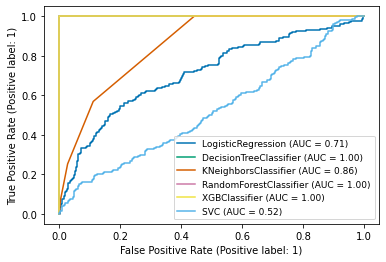

In [222]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import plot_roc_curve
import matplotlib.pyplot as plt


### How well our model works on training Data

disp = plot_roc_curve(lr,X_train_ns,y_train_ns)

plot_roc_curve(dt,X_train_ns,y_train_ns, ax= disp.ax_) #ax_ = Axes with confusion matrix

plot_roc_curve(knn,X_train_ns,y_train_ns, ax= disp.ax_)

plot_roc_curve(rf,X_train_ns,y_train_ns, ax= disp.ax_)

plot_roc_curve(xgb,X_train_ns,y_train_ns, ax= disp.ax_)

plot_roc_curve(svc,X_train_ns,y_train_ns, ax= disp.ax_)

plt.legend(prop={'size' : 9}, loc='lower right' )

plt.show()

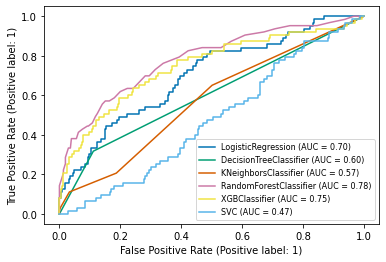

In [225]:
### How well our model works on Testing Data

disp = plot_roc_curve(lr,X_test,y_test)

plot_roc_curve(dt,X_test,y_test, ax= disp.ax_) #ax_ = Axes with confusion matrix

plot_roc_curve(knn,X_test,y_test, ax= disp.ax_)

plot_roc_curve(rf,X_test,y_test, ax= disp.ax_)

plot_roc_curve(xgb,X_test,y_test, ax= disp.ax_)

plot_roc_curve(svc,X_test,y_test, ax= disp.ax_)

plt.legend(prop={'size' : 8}, loc='lower right' )

plt.show()

### It is again proved that we will use the Random Forest Classifier as the best model


- The Logistic Regression is only covering 71% of training data and only 32% of the test data, whereas Random Forest is covering 100% of training data as well as 79% of test data

- Closest to the Random forest is XGboost classifier model but the scores a a little better with random forest

- The Random Forest will be an even better model with Hyperparameter tuning which will increase but the accuracy already @ 100% with more Area under the Curve Coverage


### Hyper parameter Tuning

In [229]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
rf= RandomForestClassifier()

#Creating parameters to pass in RandomizedSearchCV

parameters = {'criterion':['gini','entropy'],
             'max_features':['auto','sqrt','log2'],
             'min_samples_split': [1, 2, 3, 4 ,5],
             'min_samples_leaf': [1, 3, 4, 5, 6,],
             'n_estimators' : [100,200,300,400,500]
             }

GCV = GridSearchCV(estimator = rf,param_grid=parameters, verbose=2, n_jobs = -1, scoring='accuracy')
GCV.fit(X_train_ns,y_train_ns) #fitting data into the model
GCV.best_params_ #printing the best parameters found by the RandomizedSearchCV

Fitting 5 folds for each of 750 candidates, totalling 3750 fits


{'criterion': 'gini',
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 400}

In [230]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier(n_estimators = 300 ,min_samples_split=4,min_samples_leaf=1,max_features='auto',criterion='entropy')

rf.fit(X_train_ns,y_train_ns)
rf.score(X_train_ns,y_train_ns)
pred_decision =rf.predict(X_test)

rfs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',rfs*100)

rfscore = cross_val_score(rf,X,y,cv=9)
rfc =rfscore.mean()
print('Cross Val Score :',rfc*100)
print(confusion_matrix(y_test,pred_test)) 

Accuracy Score : 85.05434782608695
Cross Val Score : 85.98641661263238
[[271  34]
 [ 43  20]]


We see that after tuning we are abe to increase the score from 84.78% to 85.05% which is very good as its giving the highest among all the model , we also see that the Cv score is come much closer to the accuracy score @ 85.71% which is great as the closer the score the better the model. let save the rf model in pickle file

In [231]:
GCV_pred=GCV.best_estimator_.predict(X_test) #predicting with the best parameters

accuracy_score(y_test,GCV_pred) #Checking Final Accuracy

0.8505434782608695

In [232]:
import pickle
filename = 'Attrition.pkl'
pickle.dump(GCV,open(filename,'wb'))

### Conclusion

In [233]:
loaded_model = pickle.load(open('Attrition.pkl','rb'))
result = loaded_model.score(X_test,y_test)
print(result*100)

85.05434782608695


In [234]:
conclusion = pd.DataFrame([loaded_model.predict(X_test)[:],GCV_pred[:]],index=['Predicted','Orignal'])

In [235]:
conclusion

,0,1,2,3,4,5,6,7,8,9,...,358,359,360,361,362,363,364,365,366,367
Predicted,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Orignal,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### We have 386 columns where the model has predicted and Actuals and the model we have chosen is Random forest Classifier as the ideal model for this project¶
